# **Inference of Cardiac Category from Biomedical Data**

## **Conclusions:**
- **E_A_ratio is the only parameter necessary to predict Cardiac Category**
    - E_A_ratio has the highest feature importance by far
    - 3 Classifiers had 100% Cross-Validation (CV) score for predicting Cardiac Category when E_A_ratio is present 
- **Removing E_A_ratio worsens model performance significantly, little to no predictive power remains.**
    - RandomForestClassifier has the best performance in this case, with CV score of 62% and MeanSquaredError of 61.64%. (Not great at all)
- **Physical functional parameters, and all other parameters, have little to no power in predicting E_A_ratio**
    - Correlation index of PhysFuncParams to E_A_ratio is low.
    - Even with ALL parameters present, scores for predicting E_A_ratio using regression is still negative for all reg models.
    - Even with hyperparameter tuning for RandomForestRegressor to predict E_A_ratio using PhysFuncParams, accuracy is still low


In [51]:
# Cell 1
"""
Ideas for a one-size-fits-all pipeline:

Check if target column is categorical or continuous
Apply from dict of classification or regression models based on above
Check if each column is categorical or continous
perform one-hot encoding for categorical columns
Apply appropriate data visualisations to each
Apply correlations Matrix
Apply scaling and PCA if too many features (>20?)

IMPORTANT: Modify pipeline such that imputation of NA values are done using median of train
set AFTER the split. Save this median for use in test set

Next steps: 
- Remove white columns (look at original excel sheet)  (Done)
- Group features by colors according to excel sheet (Done)
- Check for level of correlation (correlation matrix) (Done)
- Visualise correlation matrix (Done)
- Apply scaling (standard/minmax) (Done)
- Use PCA to reduce dimension (Skipped) https://www.datacamp.com/community/tutorials/principal-component-analysis-in-python
- Apply classification algos for each color (Done)
- Apply above for everything combined (Done)
- Implement hyperparameter tuning (Optional)
- Additional data visualisation for each parameter (Split into categorical and continous)(Optional)
- Apply unsupervised learning to check for clustering
- Cleanup
- Write clear comments for future reference
- Write and present data nicely
"""
import warnings
import pandas as pd
import numpy as np
import sklearn 
import seaborn as sn
import matplotlib.pyplot as plt
from pathlib import Path
import os
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.svm import SVR, SVC
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import ShuffleSplit, GridSearchCV
from sklearn.linear_model import LinearRegression,LogisticRegression 
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import BaggingRegressor
from sklearn.neighbors import KNeighborsRegressor,KNeighborsClassifier
from sklearn.tree import DecisionTreeRegressor,DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingRegressor,GradientBoostingClassifier
from xgboost import XGBRegressor, XGBClassifier
from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier
from lightgbm import LGBMRegressor,LGBMClassifier


data = pd.read_csv("kohsm1.csv",encoding='latin1')

#Removal of irrelevant white columns
data.drop('IDshort', axis=1, inplace=True)
data.drop('SERNO', axis=1, inplace=True)

#Full Data containing only each category as targets
data_full = data.drop('Cardiac_Category EE (0=good; 1=poor)', axis=1)
# dataEE_full = data.drop('Cardiac_Category (0=good; 1=poor)', axis=1)

#List of columns according to color category
#Blue
clinParamsCols=["IDshort","Age","Weightkg","Heightcm","Pulse","WaistCircumferencecm","SERNO","Gender","SBP","DBP","Hips_Circumference__cm","Hypertension__Yes_1_No_0","Dyslipidemia__Yes_1_No_0","Diabetes_mellitus__Yes_1_No_0","Smoking__Never_0_Current_1_Past","DiabetesmellitusDietcontrol","AlcoholNever0Current1Past"]

#Teal
exerciseCols=["PhysicalactivityfrequencyIna","IntensityTakeiteasy1Heavy","Duration15min116to30min","VO2Max"]

#Violet
echoCols=["BSA__m2","IVSD__cm","IVSS__cm","LVIDD_cm","LVIDS_cm","LVPWD_cm","LVPWS_cm","LVOT__cm","AO_cm","LA_cm","LVEF","LVFS","LVmass_echo","LVmass_index_echo","Left_atrial_volume","Left_atrial_volume_index","MV_E_peak__m_s","MV_A_peak__m_s","E_A_ratio","MV_DT__ms","PASP__mmHg","PVS__cm_s","PVD__cm_s","PVA__cm_s","PVADur","MVADur","septalS","Septal_E","Septal_A","Lateral_S","lateralE","lateralA","sinuscm","sinus_tubular_junctioncm","ave_Eprime","E_Eprime_ratio"]

#Grey
cmrCols=["LV_Mass_on_mri__g","LV_EDV","EDV067","LV_ESV","LV_SV","LVEF_A","Ss","Se","Sa","SRs","SRe","SRa","SRe_SRaratio","LVGLS","LVGCS","LVGRS","RVGLS","LAGlobalGLS","LAGlobalGCS","LAvolumeminml","LAvolumemaxml","LAEFTotal","LVMassg","LVEDVImlm2","LVESVImlm2","LVSVImlm2"]

#Beige
bloodBioCols=["MCP1pgmL","MMP9ngmL","BNP","HSTNI","GALECTIN3","sUPAR","qTL","extra_urea","extra_creatinine","extra_total_cholesterol","extra_triglycerides","extra_HDL","extra_LDL","extra_tc_HDL_ratio","extra_albumin","extra_hsCRP","HbA1c"]

#Green
physFuncParamsCols=["Gripmax","G1L","G2L","G1R","G2R","SMM","BFM","PBF","WHR","Fitness_score","BMR","Lean_LA","Lean_RA","Lean_LL","Lean_RL","Lean_T","ALM"]

#Orange
curMetaCols=["TC","FC","C2","C3","C4","C51","C5","C4OH","C6","C5OHC3DC","C4DCC6OH","C81","C8","C5DC","C81OHC61DC","C8OHC6DC","C103","C102","C101","C10","C7DC","C81DC","C8DC","C122","C121","C12","C122OHC102DC","C121OH","C12OHC10DC","C143","C142","C141","C14","C143OHC123DC","C142OH","C141OH","C14OHC12DC","C163","C162","C161","C16","C163OHC143DC","C162OH","C161OHC141DC","C16OH","C183","C182","C181","C18","C183OHC163DC","C182OHC162DC","C181OHC161DC","C18OHC16DC","C204","C203","C202","C201","C20","C203OHC183DC","C202OHC182DC","C201OHC181DC","C20OHC18DC","C225","C224","C223","C222","C221","C22","C24","C26","C28","Gly1","Ala1","Ser1","Pro1","Val1","Leu1","IleLeu1","Orn1","Met1","His1","Phe1","Arg1","Cit1","Tyr1","Asp1","Glu1","Trp1"]

#Yellow
histMetaCols=["HistoC2","HistoC3","HistoC4","HistoC51","HistoC5","HistoC4NDOH","HistoC6","HistoC5NDOHC3NDDC","HistoC4NDDCC6NDOH","HistoC81","HistoC8","HistoC5NDDC","HistoC81NDOHC61NDDC","HistoC8NDOHC6NDDC","HistoC103","HistoC102","HistoC101","HistoC10","HistoC7NDDC","HistoC81NDDC","HistoC8NDDC","HistoC122","HistoC121","HistoC12","HistoC122NDOHC102NDDC","HistoC121NDOH","HistoC12NDOHC10NDDC","HistoC143","HistoC142","HistoC141","HistoC14","HistoC143NDOHC123NDDC","HistoC142NDOH","HistoC141NDOH","HistoC14NDOHC12NDDC","HistoC163","HistoC162","HistoC161","HistoC16","HistoC163NDOHC143NDDC","HistoC162NDOH","HistoC161NDOHC141NDDC","HistoC16NDOH","HistoC183","HistoC182","HistoC181","HistoC18","HistoC183NDOHC163NDDC","HistoC182NDOHC162NDDC","HistoC181NDOHC161NDDC","HistoC18NDOHC16NDDC","HistoC204","HistoC203","HistoC202","HistoC201","HistoC20","HistoC203NDOHC183NDDC","HistoC202NDOHC182NDDC","HistoC201NDOHC181NDDC","HistoC20NDOHC18NDDC","HistoC225","HistoC224","HistoC223","HistoC222","HistoC221","HistoC22","HistoC24","HistoC26","HistoC28","HistoCode","HistoGly1_ConcµM","HistoAla1_ConcµM","HistoSer1_ConcµM","HistoPro1_ConcµM","HistoVal1_ConcµM","HistoLeu1_ConcµM","HistoIle1_ConcµM","HistoOrn1_ConcµM","HistoMet1_ConcµM","HistoHis1_ConcµM","HistoPhe1_ConcµM","HistoCit1_ConcµM","HistoTyr1_ConcµM","HistoAsp1_ConcµM","HistoGlu1_ConcµM","HistoTrp1_ConcµM"]

targets=["Cardiac_Category (0=good; 1=poor)","Cardiac_Category EE (0=good; 1=poor)"]

# List comprising of params and Cardiac Category
clinParamsColsCC = clinParamsCols + [targets[0]] 
exerciseColsCC = exerciseCols + [targets[0]]
echoColsCC = echoCols + [targets[0]]
cmrColsCC = cmrCols + [targets[0]]
bloodBioColsCC = bloodBioCols + [targets[0]]
physFuncParamsColsCC = physFuncParamsCols + [targets[0]]
curMetaColsCC = curMetaCols + [targets[0]]
histMetaColsCC = histMetaCols + [targets[0]]

# List comprising of params and Cardiac Category_EE
"""
clinParamsColsCCEE = clinParamsCols + [targets[1]] 
histMetaColsCCEE = histMetaCols + [targets[1]]
exerciseColsCCEE = exerciseCols + [targets[1]]
echoColsCCEE = echoCols + [targets[1]]
cmrColsCCEE = cmrCols + [targets[1]]
bloodBioColsCCEE = bloodBioCols + [targets[1]]
physFuncParamsColsCCEE = physFuncParamsCols + [targets[1]]
curMetaColsCCEE = curMetaCols + [targets[1]]
"""
# https://stackoverflow.com/questions/48198021/filter-pandas-dataframe-with-specific-column-names-in-python

#Dataframe containing parameters and Cardiac Category
clinParamsColsCC_df=data.loc[:, data.columns.isin(clinParamsColsCC)]
exerciseColsCC_df=data.loc[:, data.columns.isin(exerciseColsCC)]
echoColsCC_df=data.loc[:, data.columns.isin(echoColsCC)]
cmrColsCC_df=data.loc[:, data.columns.isin(cmrColsCC)]
bloodBioColsCC_df=data.loc[:, data.columns.isin(bloodBioColsCC)]
physFuncParamsColsCC_df=data.loc[:, data.columns.isin(physFuncParamsColsCC)]
curMetaColsCC_df=data.loc[:, data.columns.isin(curMetaColsCC)]
histMetaColsCC_df=data.loc[:, data.columns.isin(histMetaColsCC)]

#Dataframe containing parameters and Cardiac CategoryEE
""" 
clinParamsColsCCEE_df=data.loc[:, data.columns.isin(clinParamsColsCCEE)] 
exerciseColsCCEE_df=data.loc[:, data.columns.isin(exerciseColsCCEE)]
echoColsCCEE_df=data.loc[:, data.columns.isin(echoColsCCEE)]
cmrColsCCEE_df=data.loc[:, data.columns.isin(cmrColsCCEE)]
bloodBioColsCCEE_df=data.loc[:, data.columns.isin(bloodBioColsCCEE)]
physFuncParamsColsCCEE_df=data.loc[:, data.columns.isin(physFuncParamsColsCCEE)]
curMetaColsCCEE_df=data.loc[:, data.columns.isin(curMetaColsCCEE)]
histMetaColsCCEE_df=data.loc[:, data.columns.isin(histMetaColsCCEE)]
 """
#Dict of dataframes of each color cateogry for cardiac category
cc_dfDict = {
    "clinParams":clinParamsColsCC_df,
    "exercise":exerciseColsCC_df,
    "echo":echoColsCC_df,
    "cmr":cmrColsCC_df,
    "bloodBio":bloodBioColsCC_df,
    "physFuncParams":physFuncParamsColsCC_df,
    "curMeta":curMetaColsCC_df,
    "histMeta":histMetaColsCC_df
}

#Dict of dataframes of each color cateogry for cardiac category EE
""" 
ccee_dfDict = {
    "clinParams":clinParamsColsCCEE_df,
    "exercise":exerciseColsCCEE_df,
    "echo":echoColsCCEE_df,
    "cmr":cmrColsCCEE_df,
    "bloodBio":bloodBioColsCCEE_df,
    "physFuncParams":physFuncParamsColsCCEE_df,
    "curMeta":curMetaColsCCEE_df,
    "histMeta":histMetaColsCCEE_df
}
"""

for key in cc_dfDict:
    print(f"Shape of {key}: {cc_dfDict[key].shape}")

""" 
for key in ccee_dfDict:
    print(f"Shape of {key+'(EE)'}: {cc_dfDict[key].shape}") 
"""

Shape of clinParams: (86, 16)
Shape of exercise: (86, 5)
Shape of echo: (86, 37)
Shape of cmr: (86, 27)
Shape of bloodBio: (86, 18)
Shape of physFuncParams: (86, 18)
Shape of curMeta: (86, 89)
Shape of histMeta: (86, 87)


' \nfor key in ccee_dfDict:\n    print(f"Shape of {key+\'(EE)\'}: {cc_dfDict[key].shape}") \n'

In [52]:
# Cell 2
#https://stackoverflow.com/questions/45515031/how-to-remove-columns-with-too-many-missing-values-in-python
"""
def missing(dff):
    print (round((dff.isnull().sum() * 100/ len(dff)),2).sort_values(ascending=False))
"""

# Helper function
def rmissingvaluecol(df, threshold):
    # If threshold is 80 it means we are going to drop columns having more than 80% of missing values
    l = []
    l = list(df.drop(df.loc[:,list((100*(df.isnull().sum()/len(df.index)) >= threshold))].columns, 1).columns.values)
    print("Number of columns having more than %s percent missing values: "%threshold, (df.shape[1] - len(l)))
    print("These columns are:\n", list(set(list((df.columns.values))) - set(l)))
    # Returns columns that are missing less than threshold % of data
    return l
    
def preprocessDf(df,threshold=40,verbose=False):
    print("Preprocessing dataframe...")
    if verbose:
        print("Initial info:")
        print(df.info())
    originalShape = df.shape
    newDf = df.copy()
    
    for col in newDf:
        #Checks for categorical columns that only have 2 values, and converts them to binary
        uniqueVals = pd.unique(newDf[col])
        if len(uniqueVals) == 2:
            if not(np.int64(0) in uniqueVals and np.int64(1) in uniqueVals):
                print(f"{col} column contains only 2 values. Converting to binary")
                print(uniqueVals[0])
                newDf[col] = np.where(newDf[col] == uniqueVals[0],np.int64(0),newDf[col])
                newDf[col] = np.where(newDf[col] == uniqueVals[1],np.int64(1),newDf[col])
                #Renames column with labels for binary values
                newDf.rename(columns={col:col + f"_{uniqueVals[0]}_0_{uniqueVals[1]}_1"}, inplace=True)
    
    # Converting values that are non-numeric to NA
    newDf = newDf.apply(pd.to_numeric,errors='coerce')
    print("Converting values that are non-numeric AND non-binary to NaN...")
    newCols = rmissingvaluecol(newDf,threshold) #Removes columns with more than threshold of missing data
    print("Columns with missing values (%):")
    newDf_missing = newDf.isna().sum()
    newDf_missing = newDf_missing[newDf_missing > 0].dropna().sort_values(ascending=False)
    newDf_missing = newDf_missing.apply(lambda x: np.round((x/originalShape[0])*100,2))
    print(newDf_missing)
    newDf = newDf[newCols]

    print(f"Original Shape:{df.shape}")
    print(f"Final Shape:{newDf.shape}")
    if verbose:
        print("Final info:")
        print(newDf.info())
    print("______________________________")
    return newDf

#https://stackoverflow.com/questions/17778394/list-highest-correlation-pairs-from-a-large-correlation-matrix-in-pandas

# Helper function for get_top_abs_correlations. returns list of redundant pairs to be dropped
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

# Function that returns a table of correlation indexes in descending order
def get_top_abs_correlations(df, threshold=0.6):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[au_corr>=threshold]


# Because of mixed data type (Binary and Non-binary), it would probably be 
# more correct to use Factor analysis of mixed data (FAMD) instead of simple PCA. 
# https://github.com/MaxHalford/prince#factor-analysis-of-mixed-data-famd

# Function currently not being used
def scaleAndPca(df,target,explainabilityThreshold = 0.85):
    #print(df)
    # Removes target column
    newDf = df.drop([target], axis=1)
    
    featuresLength = newDf.shape[1]
    
    """
    nonBinary = newDf.columns[~newDf.isin([0,1]).all()]
    binary = newDf.columns[newDf.isin([0,1]).all()]
    """
    scaler = StandardScaler()
    scaler.fit(newDf)
    
    newDf = scaler.transform(newDf)
    # https://towardsdatascience.com/one-hot-encoding-standardization-pca-data-preparation-steps-for-segmentation-in-python-24d07671cf0b
    # Loop Function to identify number of principal components that explain at least threshold% of the variance
    for comp in range(1, featuresLength):
        pca = PCA(n_components= comp, random_state=0)
        pca.fit(newDf)
        comp_check = pca.explained_variance_ratio_
        final_comp = comp
        if comp_check.sum() > explainabilityThreshold:
            break 
    Final_PCA = PCA(n_components= final_comp,random_state=0)
    Final_PCA.fit(newDf)
    cluster_newDf = Final_PCA.transform(newDf)
    cluster_newDf = pd.DataFrame(cluster_newDf) 
    combinedDf = pd.concat([cluster_newDf, df[target]], axis=1)
    num_comps = comp_check.shape[0]
    print(f"Reducing {featuresLength} features to {final_comp} components, we can explain {comp_check.sum()}% of the variability in the original data.")
    return combinedDf

#scaleAndPca(cc_dfDictNew["clinParams"],"Cardiac_Category (0=good; 1=poor)")


In [53]:
# Cell 3
# Display correlation data above given threshold
def outputCorrData(df,threshold=0.6,filename="Output",generateFiles=False):
    df = preprocessDf(df)
    df = df.fillna(df.median())
    # Creates correlation matrix
    corrDf = df.corr()
    # Creates corr matrix, showing correlations above given threshold
    filteredDf = corrDf[((corrDf >= threshold) | (corrDf <= -threshold)) & (corrDf !=1.000)]
    plt.figure(figsize=(20,17))
    sn.heatmap(filteredDf, annot=True, cmap="Reds")
    plt.title(f"{filename} Correlation Heatmap (Threshold: >= abs{threshold})",fontsize=20)
    # Returns a table of correlation indexes in descending order
    
    cmrCorrTable = get_top_abs_correlations(df, threshold).to_frame()
    cmrCorrTable.columns =['Abs Corr Idx']
    plt.show

    # Generates excel and png files of output in your system for future reference
    if generateFiles:
        if not os.path.exists('Outputs/Plots'):
            os.makedirs('Outputs/Plots')
        if not os.path.exists('Outputs/Tables'):
            os.makedirs('Outputs/Tables')
        plt.savefig(f'Outputs/Plots/corr_{filename}_heatmap.png')
        cmrCorrTable.to_excel(f'Outputs/Tables/corr_{filename}_table.xlsx') 
    return corrDf




def plot_feature_importance(importance,names,title):
    # Adapted from https://www.analyseup.com/learn-python-for-data-science/python-random-forest-feature-importance-plot.html
    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(10,8))
    #Plot Searborn bar chart
    sn.barplot(x=fi_df['feature_importance'][:5], y=fi_df['feature_names'][:5])
    #Add chart labels
    plt.title(title)
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')
    print(fi_df[:5])
    plt.show()
    return fi_df # returns full feature importance dataframe

#https://analyticsindiamag.com/how-to-implement-ml-models-with-small-datasets/

# https://stats.stackexchange.com/questions/416553/can-k-fold-cross-validation-cause-overfitting#:~:text=2%20Answers&text=K%2Dfold%20cross%20validation%20is,fold%20cross%2Dvalidation%20removes%20overfitting.

# Adapted from https://www.kaggle.com/brsdincer/heart-attack-prediction-detailed-explanation

# k-fold CV is used to DETECT overfitting, since it trains the model from scratch each time 

def compareClasModel(df,target,test_size=0.25,title="Dataset",showImportance=False):
    print(f"Comparing models for {title}")
    y = df[target]
    df = df.drop(target, axis = 1)
    x = preprocessDf(df)
    
    print("Initialising models...")
    xTrain,xTest,yTrain,yTest = train_test_split(x,y,test_size=test_size,random_state=0)
    xTrain = xTrain.fillna(xTrain.median())
    xTest = xTest.fillna(xTrain.median())
    #https://stackoverflow.com/questions/18689823/pandas-dataframe-replace-nan-values-with-average-of-columns

    lr = LogisticRegression(solver="liblinear").fit(xTrain,yTrain)
    gnb = GaussianNB().fit(xTrain,yTrain)
    knnc = KNeighborsClassifier().fit(xTrain,yTrain)
    dtc = DecisionTreeClassifier(random_state=0).fit(xTrain,yTrain)
    rfc = RandomForestClassifier(random_state=0,verbose=False).fit(xTrain,yTrain)
    gbmc = GradientBoostingClassifier(verbose=False).fit(xTrain,yTrain)
    xgbc = XGBClassifier(use_label_encoder=False,eval_metric= "error").fit(xTrain,yTrain)
    lgbmc = LGBMClassifier().fit(xTrain,yTrain)
    sv = SVC().fit(xTrain,yTrain)

    models = [lr,gnb,knnc,dtc,rfc,gbmc,xgbc,lgbmc,sv]
    
    # initialise empty dataframe
    comparison = pd.DataFrame(columns=["Model","AccuracyScore","MeanR2CVScore","MeanCVError"])
    # Because dataset is small, we use k-fold cross validation

    for model in models:
        name = model.__class__.__name__
        predict = model.predict(xTest)
        accuracy = accuracy_score(yTest,predict)
        r2CV = cross_val_score(model,xTest,yTest,cv=5).mean()
        error = np.sqrt(-cross_val_score(model,xTest,yTest,cv=5,scoring="neg_mean_squared_error").mean())
        result = pd.DataFrame([[name,accuracy,r2CV,error]],columns=["Model","AccuracyScore","MeanR2CVScore","MeanCVError"])
        comparison = comparison.append(result)
        if showImportance:
            try:
                importance = model.feature_importances_
                plot_feature_importance(importance,xTest.columns.tolist(),name)
            except AttributeError:
                continue
    
    print(comparison)
    print("\n")
    print(f"Highest Accuracy Score: {comparison.loc[comparison['AccuracyScore'] == comparison['AccuracyScore'].max(), 'Model'].iloc[0]}. Score: {round(comparison['AccuracyScore'].max(),2)}")
    print(f"Highest CV Score: {comparison.loc[comparison['MeanR2CVScore'] == comparison['MeanR2CVScore'].max(), 'Model'].iloc[0]}. Score: {round(comparison['MeanR2CVScore'].max(),2)}")
    print(f"Lowest CV Error: {comparison.loc[comparison['MeanCVError'] == comparison['MeanCVError'].min(), 'Model'].iloc[0]}. Score: {round(comparison['MeanCVError'].min(),2)}")
    print("\n")
    comparisonMelted = pd.melt(comparison,id_vars=['Model'])

    #sn.set_theme(style="whitegrid")
    plt.ylabel('Returns')
    
    ax = sn.barplot(x="value", y="Model", hue="variable", data=comparisonMelted)
    plt.legend(title='Metrics',bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax.set(title=f"{title}",ylabel='Model',xlabel='Percentage Score')
    plt.xlim(0, 1)
    plt.show()
    #plt.xticks(rotation=90)
    print("***********************************************")
    
    return comparison
    
def compareRegModel(df,target,test_size=0.25,title="Dataset",showImportance=False):
    print(f"Comparing models for {title}")
    y = df[target]
    df = df.drop(target, axis = 1)
    x = preprocessDf(df)
    
    print("Predicting " + title)
    xTrain,xTest,yTrain,yTest = train_test_split(x,y,test_size=test_size,random_state=0)
    xTrain = xTrain.fillna(xTrain.median())
    xTest = xTest.fillna(xTrain.median())
    #https://stackoverflow.com/questions/18689823/pandas-dataframe-replace-nan-values-with-average-of-columns

    lr = LinearRegression().fit(xTrain,yTrain)
    pls = PLSRegression().fit(xTrain,yTrain)
    ridge = Ridge().fit(xTrain,yTrain)
    lasso = Lasso().fit(xTrain,yTrain)
    elasticnet = ElasticNet().fit(xTrain,yTrain)
    knnr = KNeighborsRegressor().fit(xTrain,yTrain)
    dtr = DecisionTreeRegressor(random_state=0).fit(xTrain,yTrain)
    baggr = BaggingRegressor(random_state=0,bootstrap_features=True,verbose=False).fit(xTrain,yTrain)
    rfr = RandomForestRegressor(random_state=0,verbose=False).fit(xTrain,yTrain)
    gbmr = GradientBoostingRegressor(verbose=False).fit(xTrain,yTrain)
    xgbr = XGBRegressor().fit(xTrain,yTrain)
    lgbmr = LGBMRegressor().fit(xTrain,yTrain)
    sv = SVR().fit(xTrain,yTrain)

    models = [lr,pls,ridge,lasso,elasticnet,knnr,dtr,baggr,rfr,gbmr,xgbr,lgbmr,sv]
    
    # initialise empty dataframe
    comparison = pd.DataFrame(columns=["Model","MeanR2CVScore","MeanR2CVError"])
    # Because dataset is small, we use k-fold cross validation

    for model in models:
        name = model.__class__.__name__
        r2CV = cross_val_score(model,xTest,yTest,cv=5,scoring="r2").mean()
        error = np.sqrt(-cross_val_score(model,xTest,yTest,cv=5,scoring="neg_mean_squared_error").mean())
        result = pd.DataFrame([[name,r2CV,error]],columns=["Model","MeanR2CVScore","MeanR2CVError"])
        comparison = comparison.append(result)
        if showImportance:
            try:
                importance = model.feature_importances_
                plot_feature_importance(importance,xTest.columns.tolist(),name)
            except AttributeError:
                continue
    
    print(comparison)
    print("\n")
    print(f"Highest R2CV Score: {comparison.loc[comparison['MeanR2CVScore'] == comparison['MeanR2CVScore'].max(), 'Model'].iloc[0]}. Score: {round(comparison['MeanR2CVScore'].max(),2)}")
    print(f"Lowest CV Error: {comparison.loc[comparison['MeanR2CVError'] == comparison['MeanR2CVError'].min(), 'Model'].iloc[0]}. Score: {round(comparison['MeanR2CVError'].min(),2)}")
    print("\n")
    comparison = comparison.drop(["MeanR2CVError"],axis = 1)
    comparisonMelted = pd.melt(comparison,id_vars=['Model'])

    #sn.set_theme(style="whitegrid")
    plt.ylabel('Returns')
    
    ax = sn.barplot(x="value", y="Model", hue="variable", data=comparisonMelted)
    plt.legend(title='Metrics',bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax.set(title=f"{title}",ylabel='Model',xlabel='Values')
    plt.xlim(-1,1)
    plt.show()
    #plt.xticks(rotation=90)
    print("***********************************************")
    
    return comparison
    

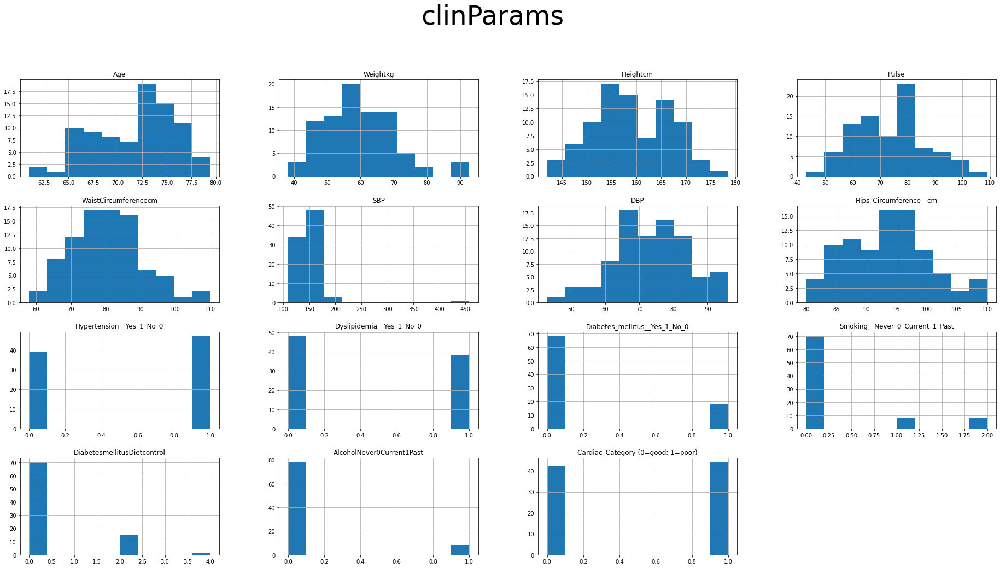

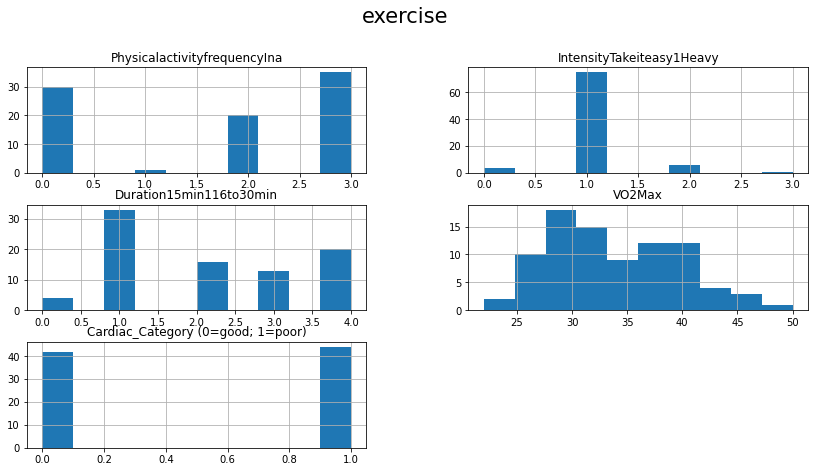

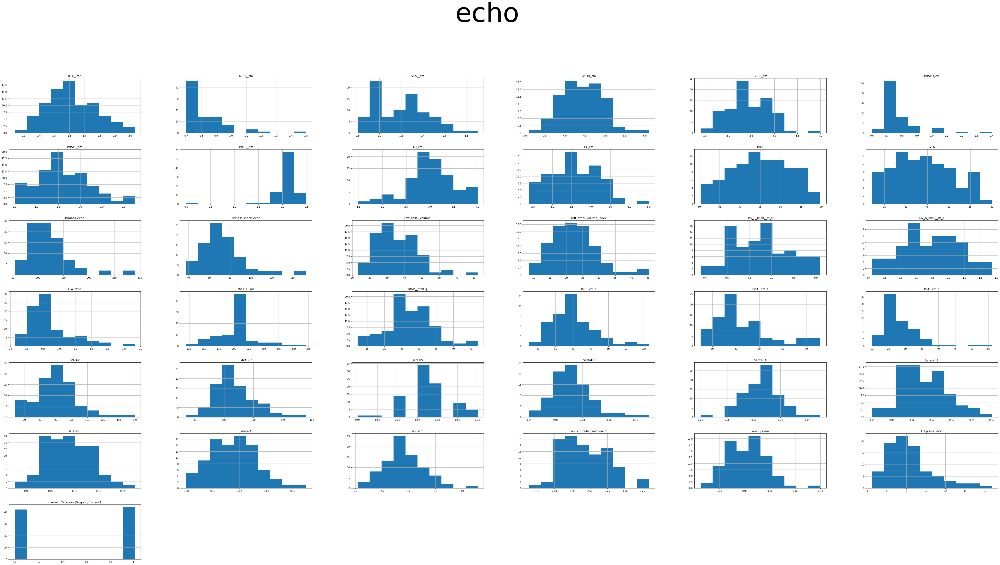

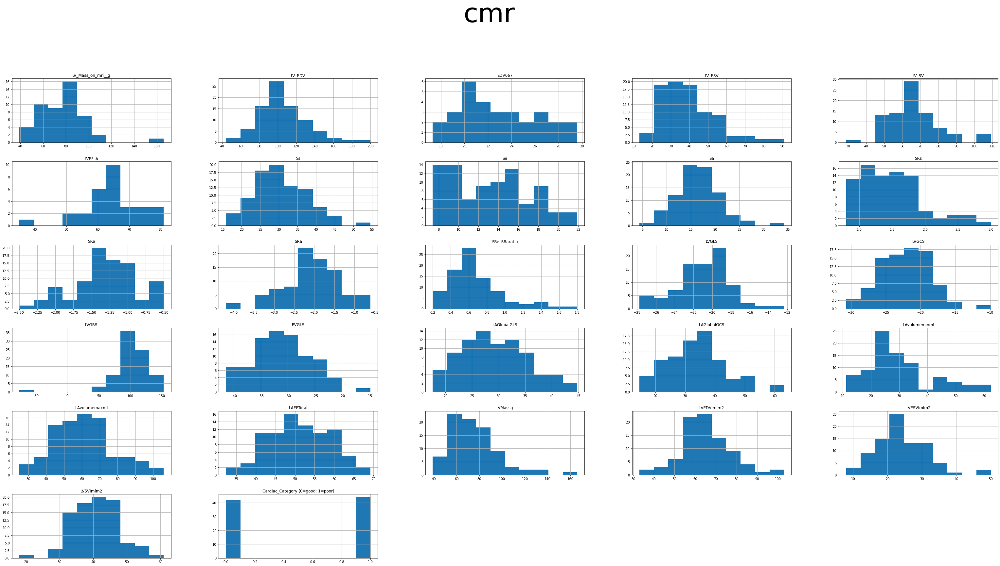

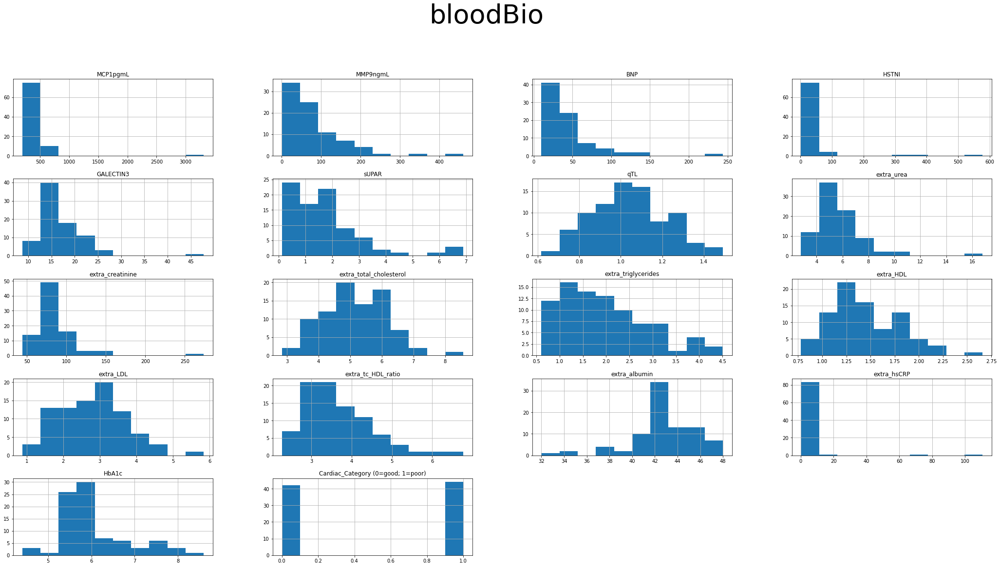

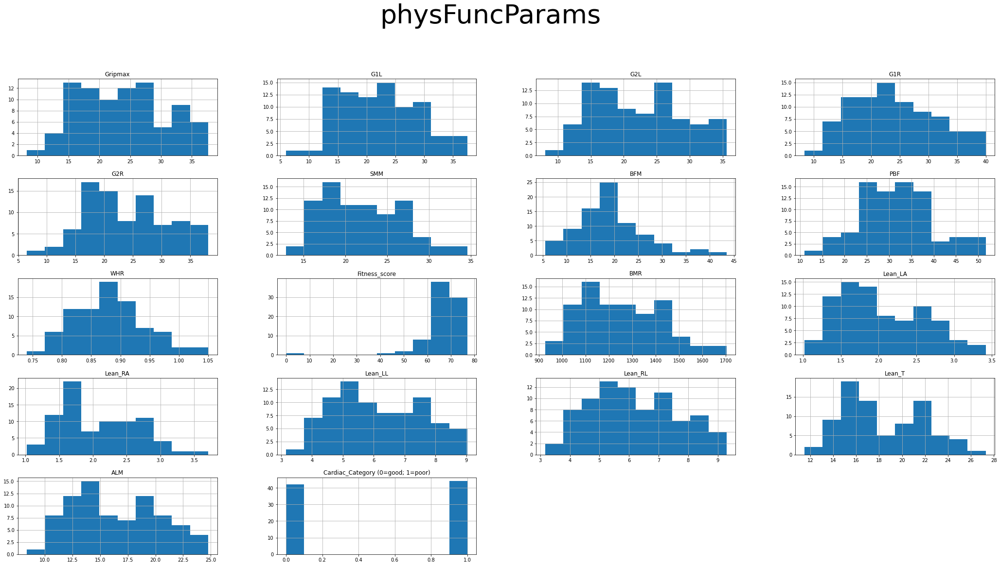

In [54]:
# Cell 4
for key in cc_dfDict:
    width = max(cc_dfDict[key].shape[1]*2,14)
    height = max(cc_dfDict[key].shape[1],7)
    ax = cc_dfDict[key].hist(figsize=(width,height))
    plt.suptitle(key, fontsize=width+height, ha='center', va ='center')
    plt.show()

Working on clinParams
Preprocessing dataframe...
Gender column contains only 2 values. Converting to binary
Male
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
Series([], dtype: int64)
Original Shape:(86, 16)
Final Shape:(86, 16)
______________________________
Working on exercise
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
Series([], dtype: int64)
Original Shape:(86, 5)
Final Shape:(86, 5)
______________________________
Working on echo
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
PASP__mmHg                  8.14
PVS__cm_s

'\nfor key in ccee_dfDict:\n    print(f"Working on {key+\'EE\'}")\n    outputCorrData(ccee_dfDict[key],filename=key+"EE",generateFiles=False)\n'

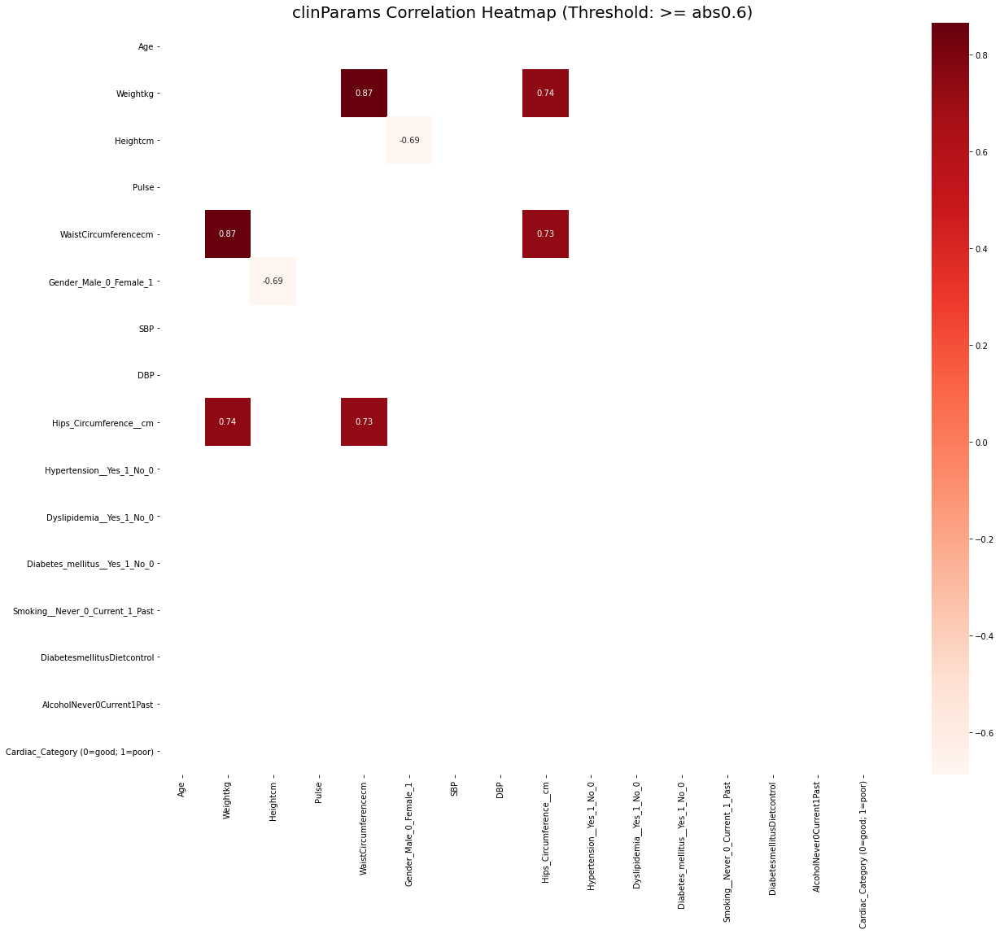

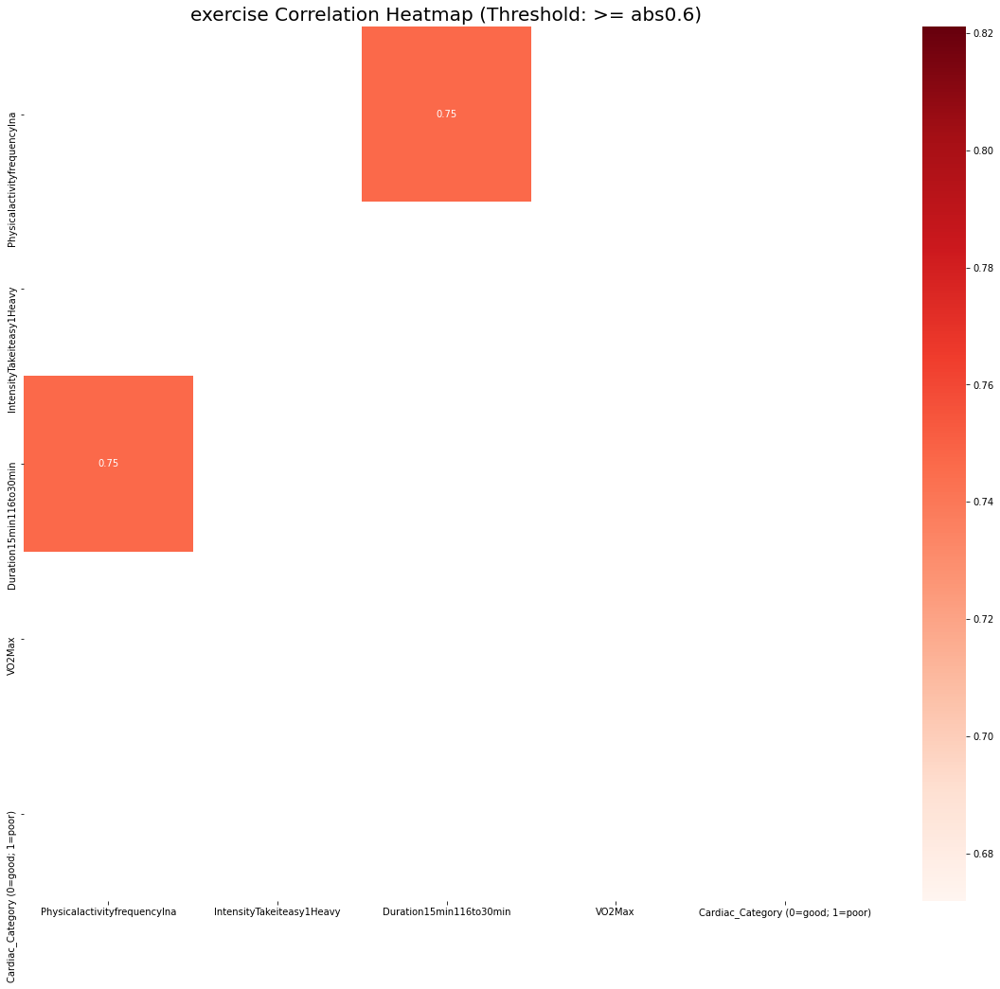

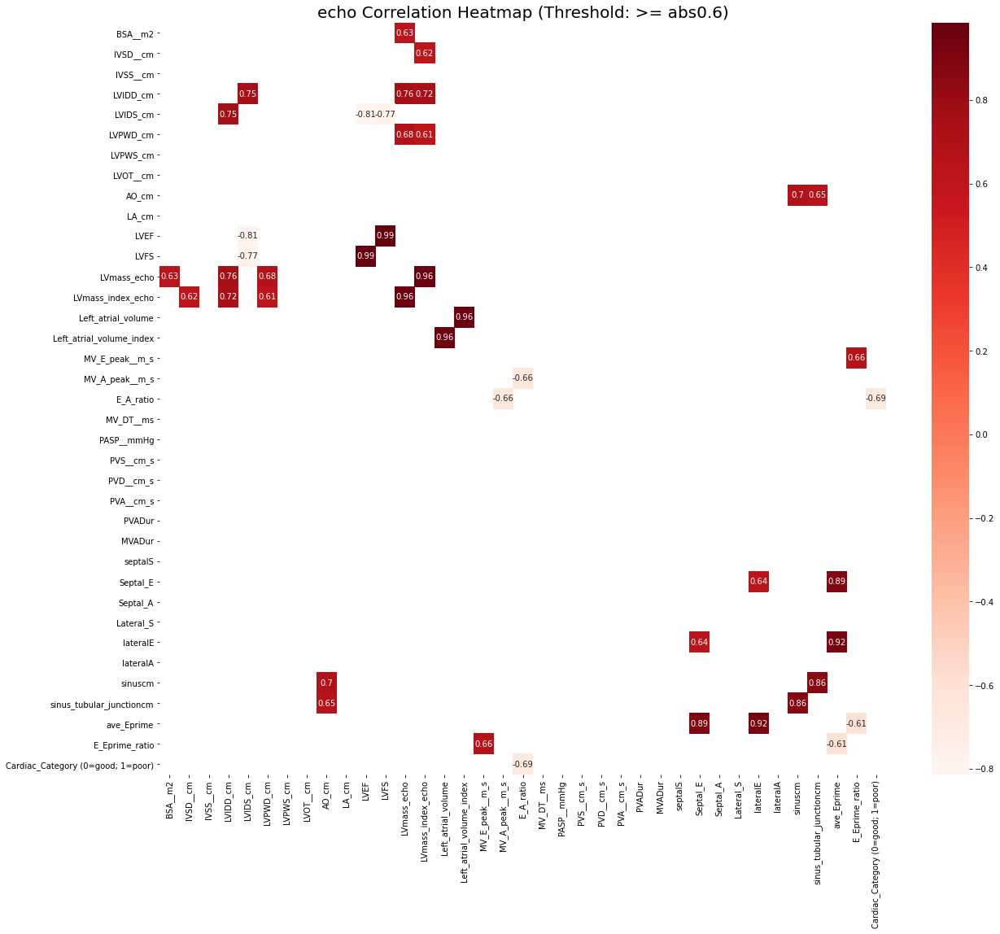

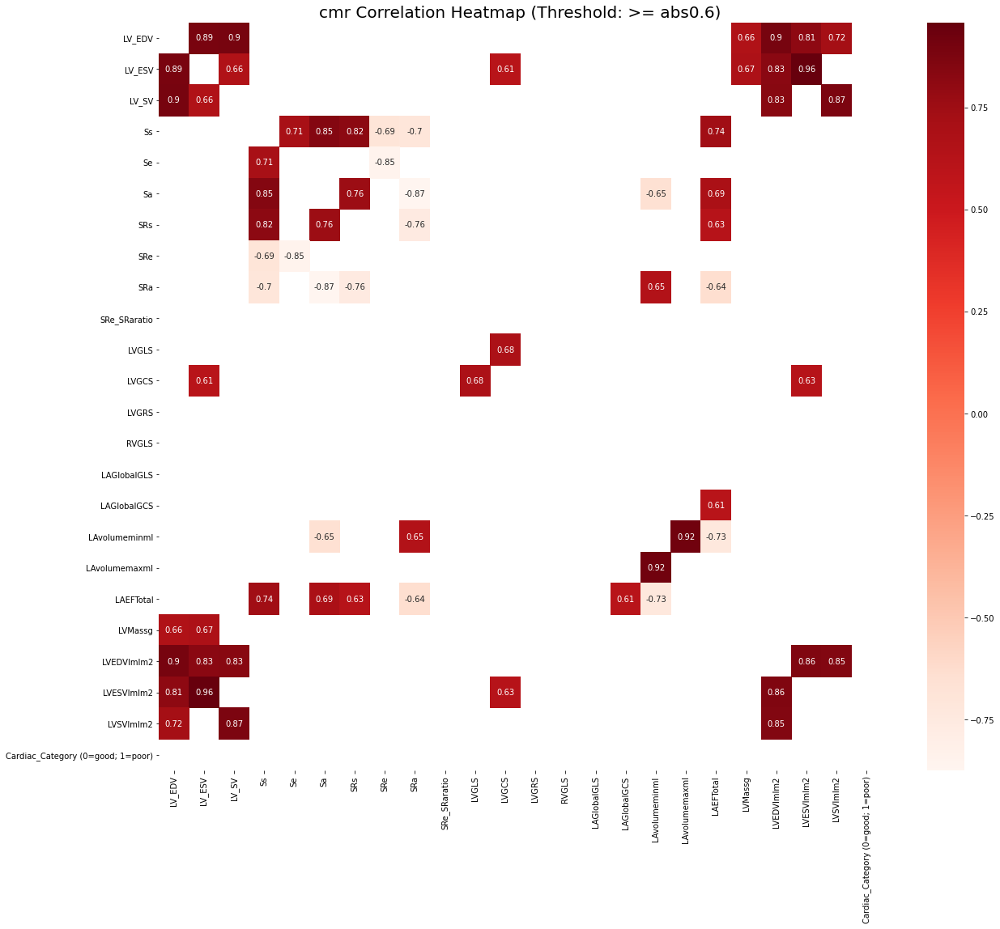

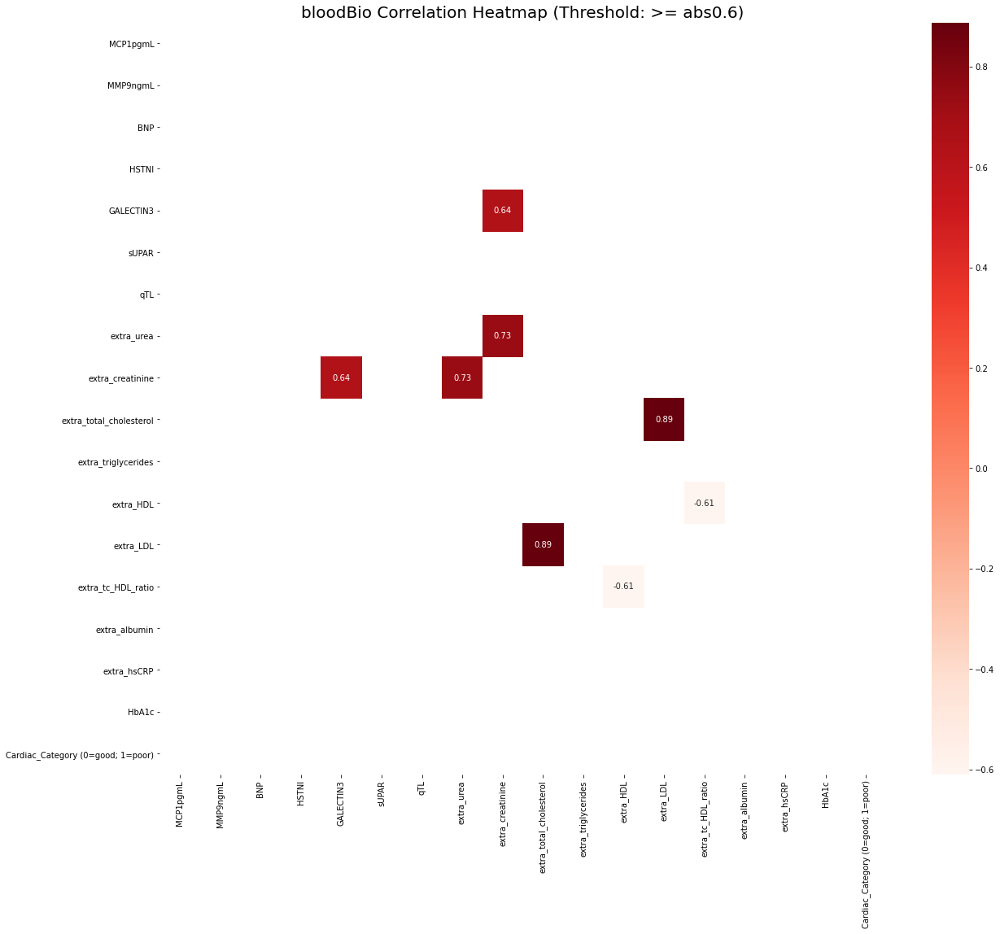

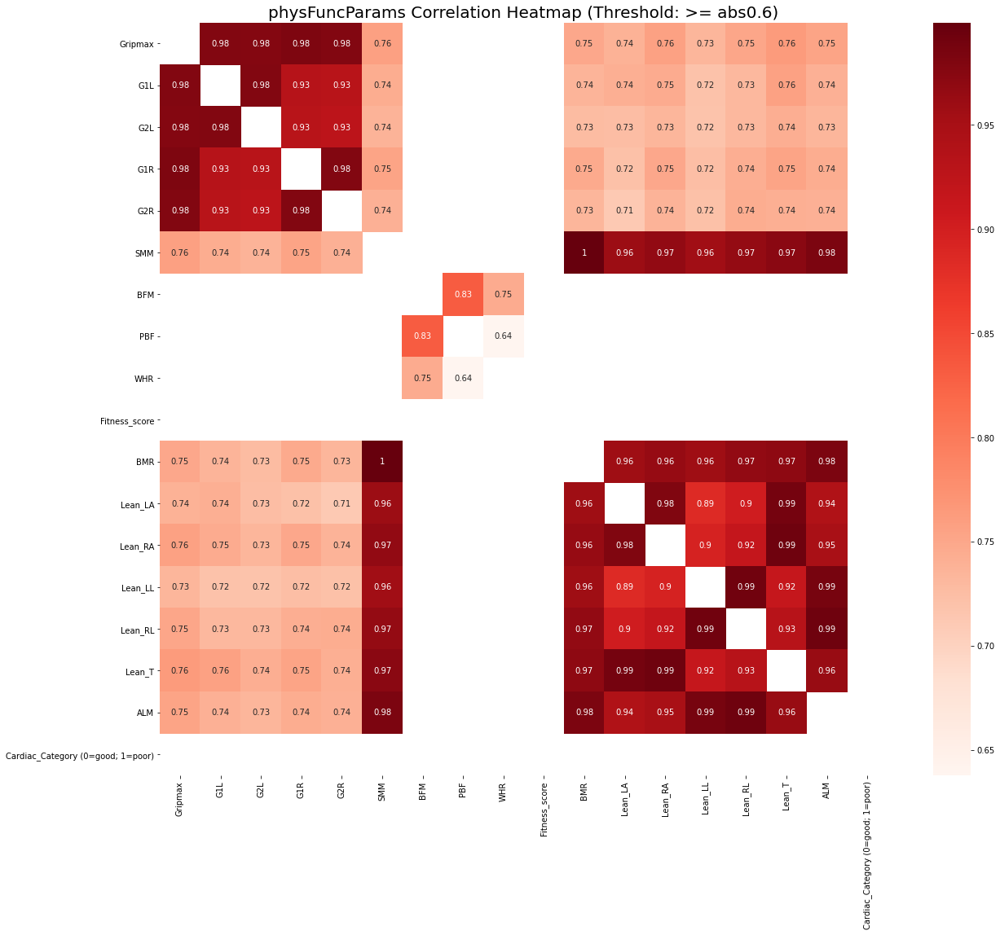

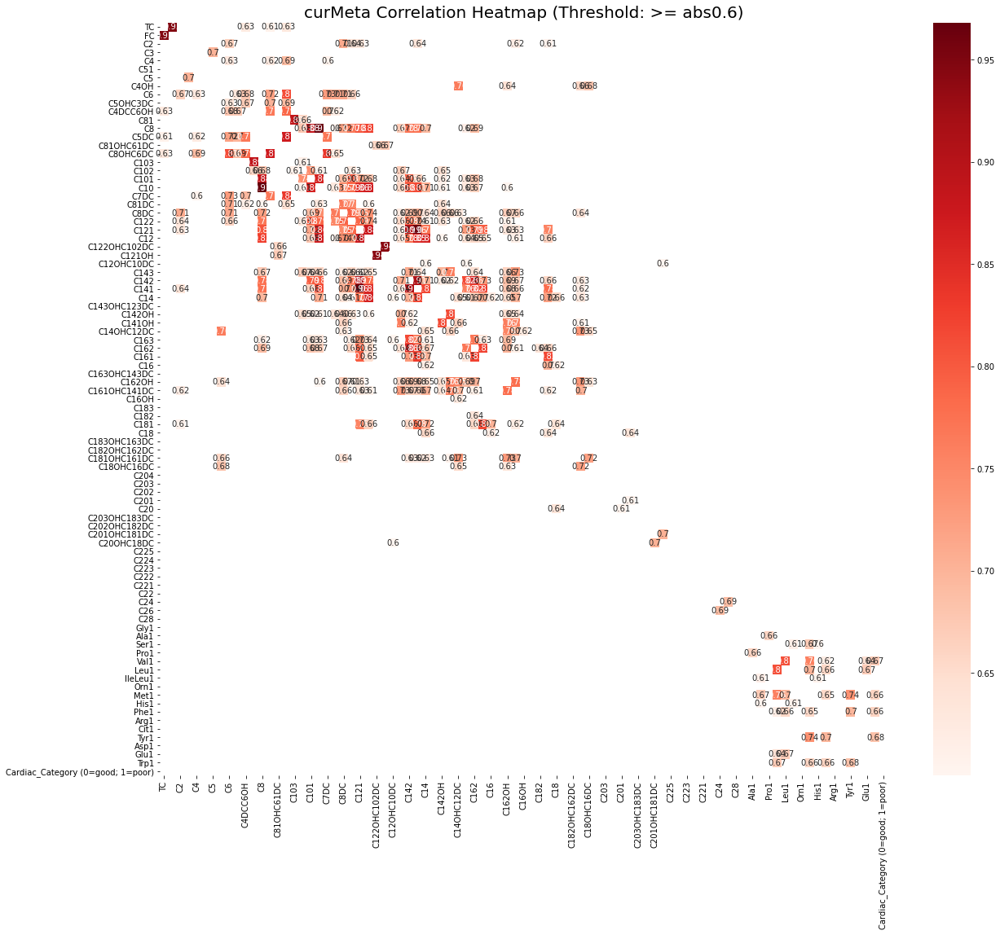

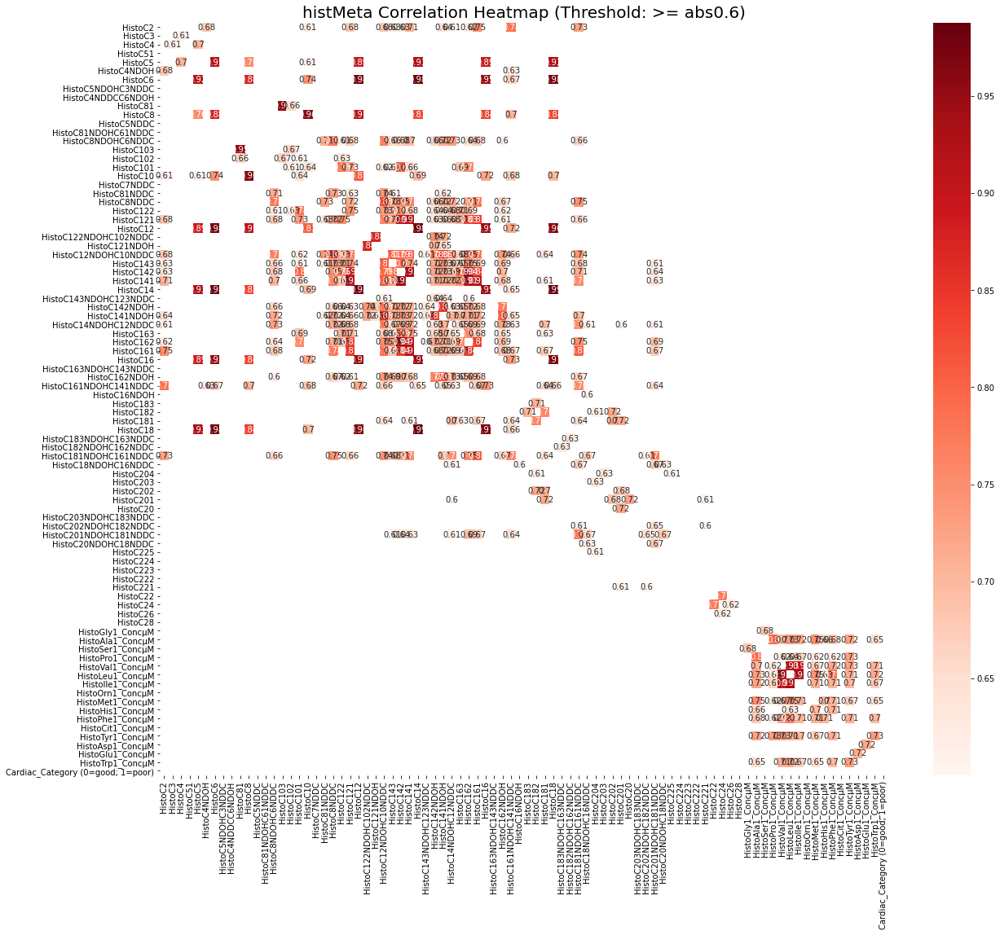

In [55]:
# Cell 5
# Churn out batches of correlation figures and tables
# Might be abit slow

for key in cc_dfDict:
    print(f"Working on {key}")
    outputCorrData(cc_dfDict[key],filename=key,generateFiles=False)

"""
for key in ccee_dfDict:
    print(f"Working on {key+'EE'}")
    outputCorrData(ccee_dfDict[key],filename=key+"EE",generateFiles=False)
"""

Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
Fitness_score    6.98
WHR              5.81
Lean_T           5.81
Lean_RL          5.81
Lean_LL          5.81
Lean_RA          5.81
Lean_LA          5.81
BMR              5.81
ALM              5.81
PBF              5.81
BFM              5.81
SMM              5.81
G1L              1.16
G2R              1.16
G1R              1.16
G2L              1.16
Gripmax          1.16
dtype: float64
Original Shape:(86, 18)
Final Shape:(86, 18)
______________________________


,Gripmax,G1L,G2L,G1R,G2R,SMM,BFM,PBF,WHR,Fitness_score,BMR,Lean_LA,Lean_RA,Lean_LL,Lean_RL,Lean_T,ALM,LVEF
Gripmax,1.000000,0.978465,0.977215,0.981332,0.978025,0.758203,-0.141253,-0.509535,0.051581,-0.038496,0.750100,0.738887,0.757050,0.734841,0.751589,0.763942,0.753783,-0.153585
G1L,0.978465,1.000000,0.978355,0.933079,0.930976,0.743985,-0.113186,-0.481093,0.080991,-0.038808,0.736220,0.742243,0.745942,0.720873,0.732290,0.756467,0.739838,-0.115122
G2L,0.977215,0.978355,1.000000,0.930490,0.927135,0.738014,-0.119764,-0.488339,0.043897,-0.063748,0.728167,0.726471,0.734105,0.718348,0.731614,0.743138,0.734558,-0.147289
G1R,0.981332,0.933079,0.930490,1.000000,0.979068,0.754292,-0.165590,-0.521632,0.034949,-0.009292,0.746746,0.721659,0.750480,0.724302,0.742608,0.753810,0.743914,-0.156343
G2R,0.978025,0.930976,0.927135,0.979068,1.000000,0.739910,-0.178644,-0.526134,0.018905,-0.032729,0.733937,0.711284,0.737454,0.721981,0.743777,0.741600,0.740325,-0.184609
SMM,0.758203,0.743985,0.738014,0.754292,0.739910,1.000000,0.063827,-0.422470,0.112320,0.062785,0.999153,0.959710,0.967510,0.956647,0.966631,0.972972,0.982642,-0.220597
BFM,-0.141253,-0.113186,-0.119764,-0.165590,-0.178644,0.063827,1.000000,0.832513,0.746244,-0.350894,0.064105,0.210529,0.177713,-0.003803,0.002542,0.181930,0.054491,0.018108
PBF,-0.509535,-0.481093,-0.488339,-0.521632,-0.526134,-0.422470,0.832513,1.000000,0.637839,-0.313045,-0.423988,-0.265828,-0.295713,-0.476999,-0.471055,-0.299855,-0.429255,0.136584
WHR,0.051581,0.080991,0.043897,0.034949,0.018905,0.112320,0.746244,0.637839,1.000000,-0.377443,0.109173,0.323383,0.302505,-0.008852,0.019034,0.306681,0.095808,-0.026643
Fitness_score,-0.038496,-0.038808,-0.063748,-0.009292,-0.032729,0.062785,-0.350894,-0.313045,-0.377443,1.000000,0.059465,-0.070648,-0.053979,0.088441,0.038425,-0.051331,0.030122,0.091600


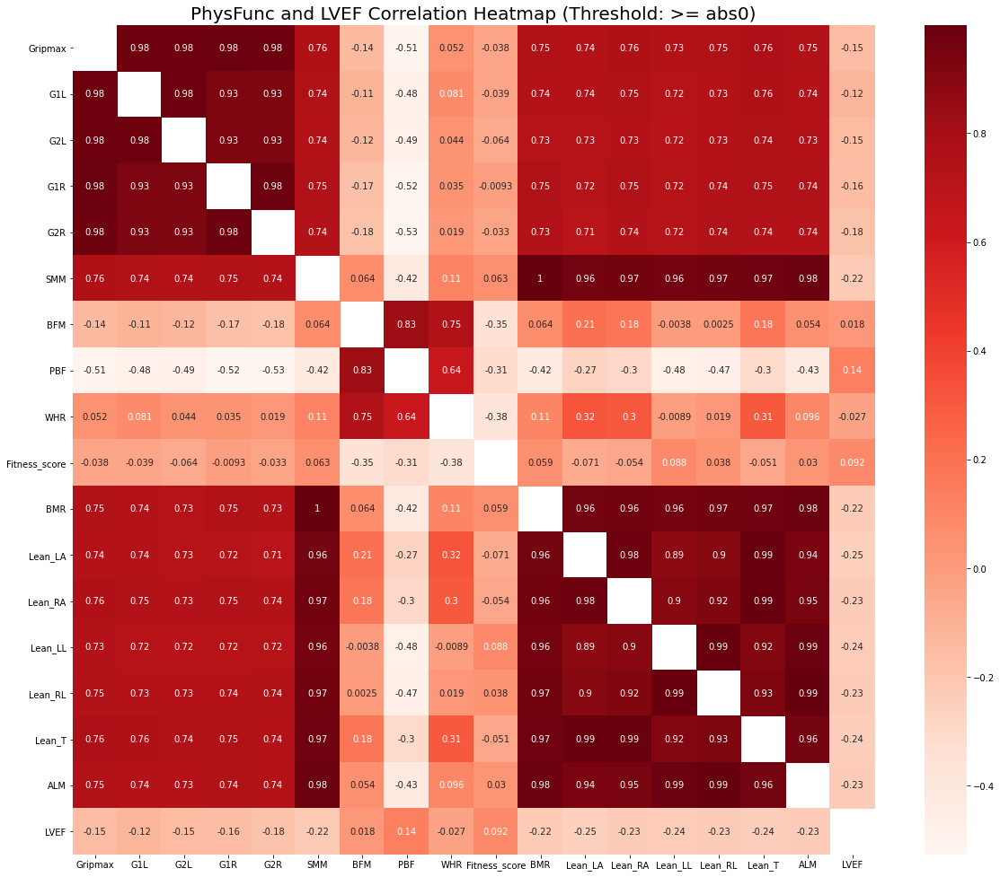

In [56]:
# Cell 6
# Output correlation data between phys func parameters and LVEF
regData1 = data[physFuncParamsCols + ["LVEF"]]
outputCorrData(regData1,threshold=0,filename="PhysFunc and LVEF")

Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
Fitness_score    6.98
WHR              5.81
Lean_T           5.81
Lean_RL          5.81
Lean_LL          5.81
Lean_RA          5.81
Lean_LA          5.81
BMR              5.81
ALM              5.81
PBF              5.81
BFM              5.81
SMM              5.81
G1L              1.16
G2R              1.16
G1R              1.16
G2L              1.16
Gripmax          1.16
dtype: float64
Original Shape:(86, 18)
Final Shape:(86, 18)
______________________________


,Gripmax,G1L,G2L,G1R,G2R,SMM,BFM,PBF,WHR,Fitness_score,BMR,Lean_LA,Lean_RA,Lean_LL,Lean_RL,Lean_T,ALM,E_A_ratio
Gripmax,1.000000,0.978465,0.977215,0.981332,0.978025,0.758203,-0.141253,-0.509535,0.051581,-0.038496,0.750100,0.738887,0.757050,0.734841,0.751589,0.763942,0.753783,0.003463
G1L,0.978465,1.000000,0.978355,0.933079,0.930976,0.743985,-0.113186,-0.481093,0.080991,-0.038808,0.736220,0.742243,0.745942,0.720873,0.732290,0.756467,0.739838,-0.030138
G2L,0.977215,0.978355,1.000000,0.930490,0.927135,0.738014,-0.119764,-0.488339,0.043897,-0.063748,0.728167,0.726471,0.734105,0.718348,0.731614,0.743138,0.734558,-0.013362
G1R,0.981332,0.933079,0.930490,1.000000,0.979068,0.754292,-0.165590,-0.521632,0.034949,-0.009292,0.746746,0.721659,0.750480,0.724302,0.742608,0.753810,0.743914,0.026848
G2R,0.978025,0.930976,0.927135,0.979068,1.000000,0.739910,-0.178644,-0.526134,0.018905,-0.032729,0.733937,0.711284,0.737454,0.721981,0.743777,0.741600,0.740325,0.017177
SMM,0.758203,0.743985,0.738014,0.754292,0.739910,1.000000,0.063827,-0.422470,0.112320,0.062785,0.999153,0.959710,0.967510,0.956647,0.966631,0.972972,0.982642,-0.035518
BFM,-0.141253,-0.113186,-0.119764,-0.165590,-0.178644,0.063827,1.000000,0.832513,0.746244,-0.350894,0.064105,0.210529,0.177713,-0.003803,0.002542,0.181930,0.054491,-0.298354
PBF,-0.509535,-0.481093,-0.488339,-0.521632,-0.526134,-0.422470,0.832513,1.000000,0.637839,-0.313045,-0.423988,-0.265828,-0.295713,-0.476999,-0.471055,-0.299855,-0.429255,-0.260349
WHR,0.051581,0.080991,0.043897,0.034949,0.018905,0.112320,0.746244,0.637839,1.000000,-0.377443,0.109173,0.323383,0.302505,-0.008852,0.019034,0.306681,0.095808,-0.377930
Fitness_score,-0.038496,-0.038808,-0.063748,-0.009292,-0.032729,0.062785,-0.350894,-0.313045,-0.377443,1.000000,0.059465,-0.070648,-0.053979,0.088441,0.038425,-0.051331,0.030122,0.108244


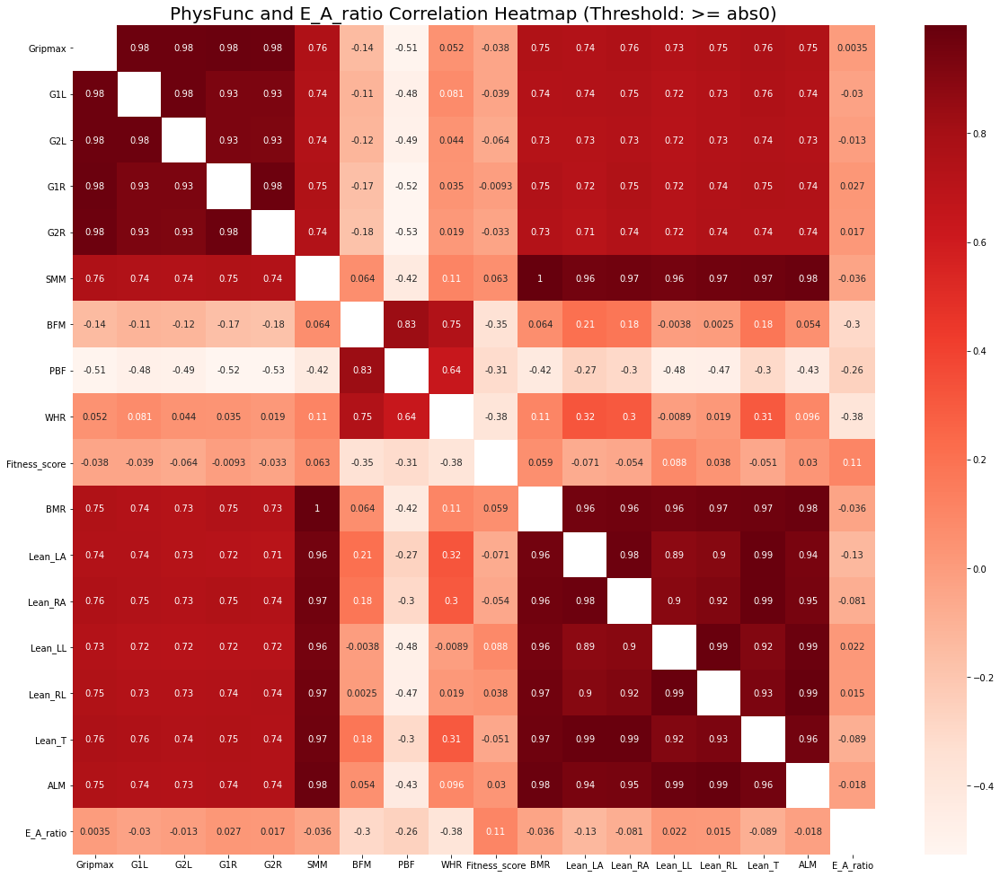

In [57]:
# Cell 7
# Output correlation data between phys func parameters and E_A_Ratio
regData2 = data[physFuncParamsCols + ["E_A_ratio"]]
outputCorrData(regData2,threshold=0,filename="PhysFunc and E_A_ratio")

Comparing models for Model comparison for full data, target=Cardiac_Category (0=good; 1=poor)
Preprocessing dataframe...
Gender column contains only 2 values. Converting to binary
Male
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  4
These columns are:
 ['EDV067', 'LV_Mass_on_mri__g', 'LVEF_A', 'HistoCode']
Columns with missing values (%):
HistoCode                   100.00
EDV067                       65.12
LVEF_A                       65.12
LV_Mass_on_mri__g            43.02
Leu1                         13.95
C28                          13.95
C26                          13.95
C24                          13.95
PASP__mmHg                    8.14
C102                          6.98
Fitness_score                 6.98
Lean_RA                       5.81
WHR                           5.81
BMR                           5.81
Lean_LA                       5.81
Lean_RL                       5.81
Lean_LL           

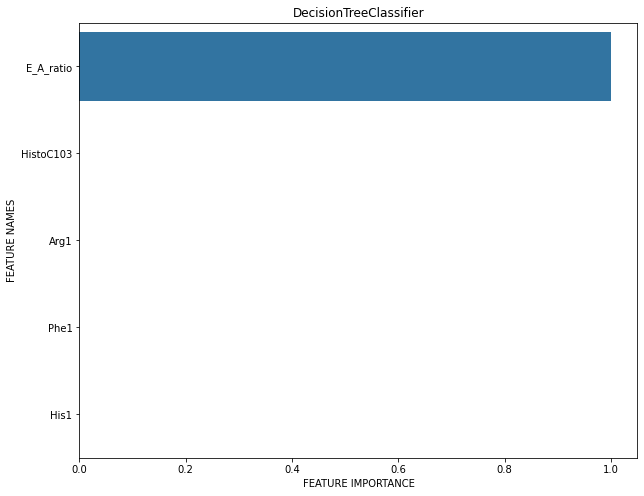

             feature_names  feature_importance
37               E_A_ratio            0.128019
35          MV_E_peak__m_s            0.028979
36          MV_A_peak__m_s            0.021641
236              HistoC162            0.020767
231  HistoC143NDOHC123NDDC            0.015801


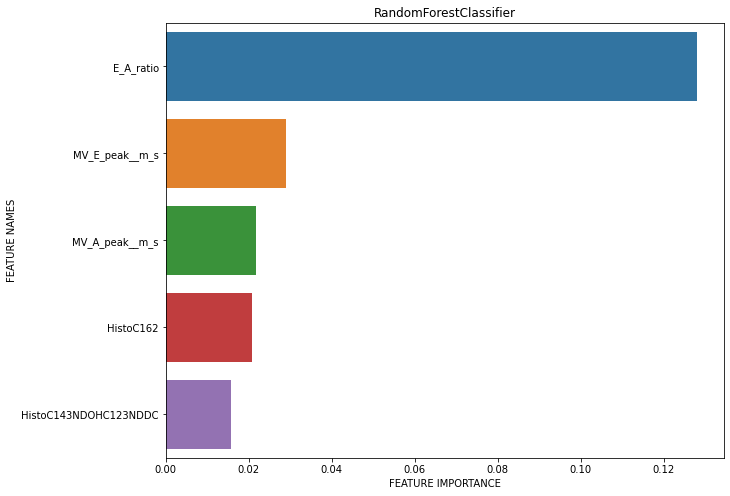

    feature_names  feature_importance
37      E_A_ratio        1.000000e+00
74        LVMassg        1.245627e-16
115            C3        1.032644e-16
20       IVSD__cm        7.831556e-17
223      HistoC12        6.647646e-17


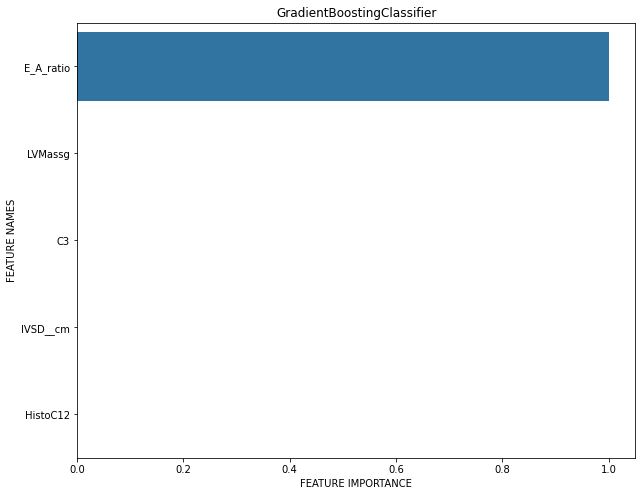

    feature_names  feature_importance
37      E_A_ratio                 1.0
214     HistoC103                 0.0
194          Arg1                 0.0
193          Phe1                 0.0
192          His1                 0.0


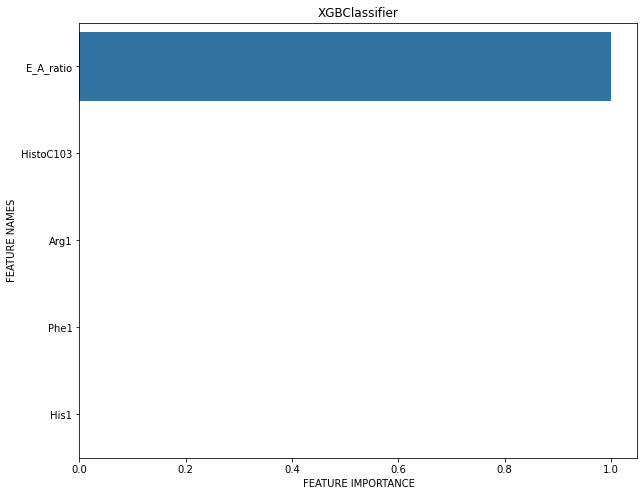

             feature_names  feature_importance
37               E_A_ratio                  58
231  HistoC143NDOHC123NDDC                   7
35          MV_E_peak__m_s                   5
260              HistoC225                   5
22                LVIDD_cm                   5


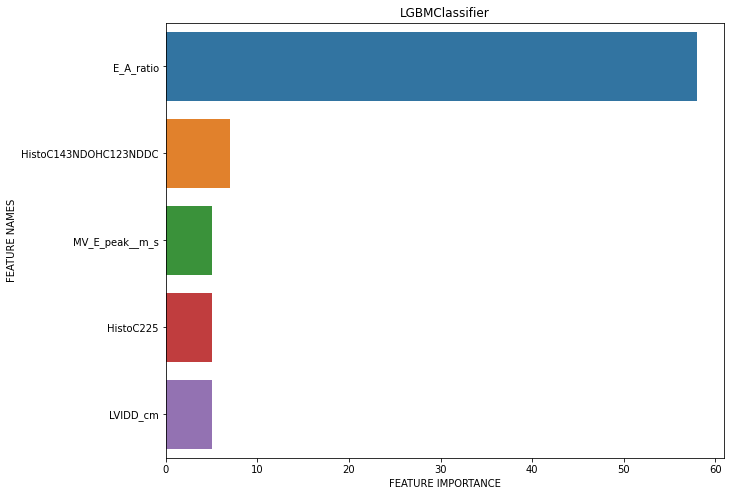

                        Model  AccuracyScore  MeanR2CVScore  MeanCVError
0          LogisticRegression       0.636364           0.35     0.806226
0                  GaussianNB       0.636364           0.41     0.768115
0        KNeighborsClassifier       0.318182           0.28     0.848528
0      DecisionTreeClassifier       1.000000           1.00    -0.000000
0      RandomForestClassifier       0.954545           0.76     0.489898
0  GradientBoostingClassifier       1.000000           1.00    -0.000000
0               XGBClassifier       1.000000           1.00    -0.000000
0              LGBMClassifier       0.954545           0.54     0.678233
0                         SVC       0.590909           0.54     0.678233


Highest Accuracy Score: DecisionTreeClassifier. Score: 1.0
Highest CV Score: DecisionTreeClassifier. Score: 1.0
Lowest CV Error: DecisionTreeClassifier. Score: -0.0




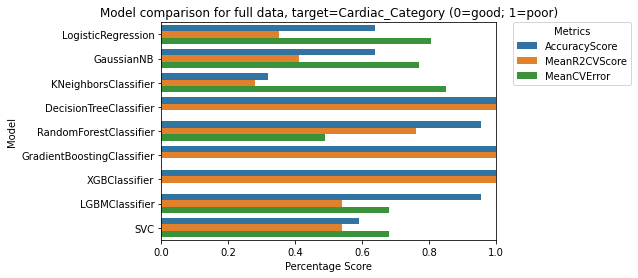

***********************************************


,Model,AccuracyScore,MeanR2CVScore,MeanCVError
0,LogisticRegression,0.636364,0.35,0.806226
0,GaussianNB,0.636364,0.41,0.768115
0,KNeighborsClassifier,0.318182,0.28,0.848528
0,DecisionTreeClassifier,1.000000,1.00,-0.000000
0,RandomForestClassifier,0.954545,0.76,0.489898
0,GradientBoostingClassifier,1.000000,1.00,-0.000000
0,XGBClassifier,1.000000,1.00,-0.000000
0,LGBMClassifier,0.954545,0.54,0.678233
0,SVC,0.590909,0.54,0.678233


In [58]:
# Cell 8
# Using full data to classify cardiac category

targetFeat = "Cardiac_Category (0=good; 1=poor)"
compareClasModel(data_full,targetFeat,title=f"Model comparison for full data, target={targetFeat}",showImportance = True)


Comparing models for Model comparison for clinParams, target=Cardiac_Category (0=good; 1=poor)
Preprocessing dataframe...
Gender column contains only 2 values. Converting to binary
Male
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
Series([], dtype: int64)
Original Shape:(86, 15)
Final Shape:(86, 15)
______________________________
Initialising models...
                        Model  AccuracyScore  MeanR2CVScore  MeanCVError
0          LogisticRegression       0.681818           0.46     0.734847
0                  GaussianNB       0.409091           0.56     0.663325
0        KNeighborsClassifier       0.636364           0.55     0.670820
0      DecisionTreeClassifier       0.454545           0.41     0.768115
0      RandomForestClassifier       0.454545           0.63     0.608276
0  GradientBoostingClassifier       0.318182           0.50     0.7

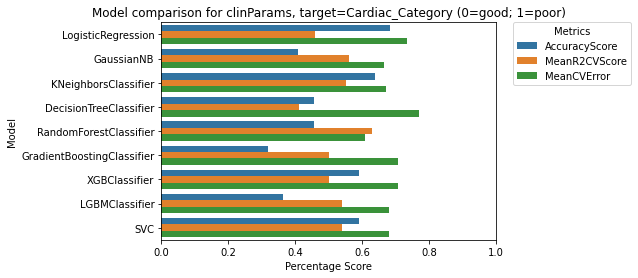

***********************************************
Comparing models for Model comparison for exercise, target=Cardiac_Category (0=good; 1=poor)
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
Series([], dtype: int64)
Original Shape:(86, 4)
Final Shape:(86, 4)
______________________________
Initialising models...
                        Model  AccuracyScore  MeanR2CVScore  MeanCVError
0          LogisticRegression       0.545455           0.49     0.714143
0                  GaussianNB       0.500000           0.46     0.734847
0        KNeighborsClassifier       0.636364           0.39     0.781025
0      DecisionTreeClassifier       0.590909           0.64     0.600000
0      RandomForestClassifier       0.681818           0.41     0.768115
0  GradientBoostingClassifier       0.590909           0.46     0.734847
0             

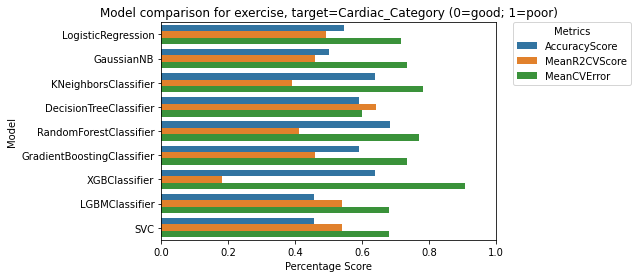

***********************************************
Comparing models for Model comparison for echo, target=Cardiac_Category (0=good; 1=poor)
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
PASP__mmHg                  8.14
PVS__cm_s                   2.33
PVD__cm_s                   2.33
PVA__cm_s                   2.33
PVADur                      2.33
sinuscm                     2.33
sinus_tubular_junctioncm    2.33
LVFS                        1.16
Left_atrial_volume          1.16
Left_atrial_volume_index    1.16
MV_DT__ms                   1.16
dtype: float64
Original Shape:(86, 36)
Final Shape:(86, 36)
______________________________
Initialising models...
                        Model  AccuracyScore  MeanR2CVScore  MeanCVError
0          LogisticRegression       0.681818           0.35     0.806226
0                  GaussianN

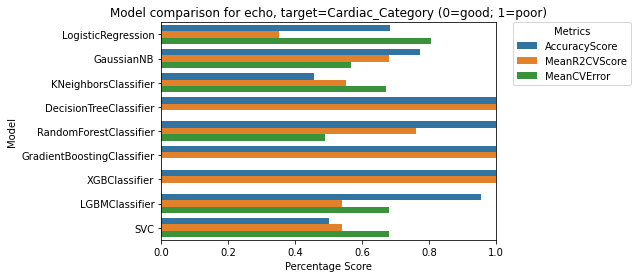

***********************************************
Comparing models for Model comparison for cmr, target=Cardiac_Category (0=good; 1=poor)
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  3
These columns are:
 ['LV_Mass_on_mri__g', 'LVEF_A', 'EDV067']
Columns with missing values (%):
EDV067               65.12
LVEF_A               65.12
LV_Mass_on_mri__g    43.02
LAGlobalGLS           4.65
LAGlobalGCS           4.65
LVGCS                 1.16
LVGRS                 1.16
dtype: float64
Original Shape:(86, 26)
Final Shape:(86, 23)
______________________________
Initialising models...
                        Model  AccuracyScore  MeanR2CVScore  MeanCVError
0          LogisticRegression       0.681818           0.59     0.640312
0                  GaussianNB       0.636364           0.54     0.678233
0        KNeighborsClassifier       0.545455           0.68     0.565685
0      DecisionTre

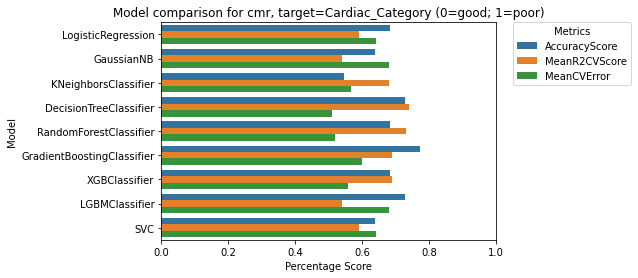

***********************************************
Comparing models for Model comparison for bloodBio, target=Cardiac_Category (0=good; 1=poor)
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
BNP          5.81
GALECTIN3    5.81
HSTNI        4.65
MMP9ngmL     2.33
sUPAR        1.16
qTL          1.16
dtype: float64
Original Shape:(86, 17)
Final Shape:(86, 17)
______________________________
Initialising models...
                        Model  AccuracyScore  MeanR2CVScore  MeanCVError
0          LogisticRegression       0.636364           0.77     0.479583
0                  GaussianNB       0.545455           0.64     0.600000
0        KNeighborsClassifier       0.545455           0.58     0.648074
0      DecisionTreeClassifier       0.500000           0.39     0.781025
0      RandomForestClassifier       0.545455           0.66 

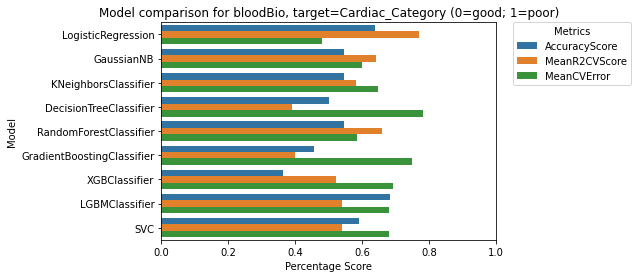

***********************************************
Comparing models for Model comparison for physFuncParams, target=Cardiac_Category (0=good; 1=poor)
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
Fitness_score    6.98
WHR              5.81
Lean_T           5.81
Lean_RL          5.81
Lean_LL          5.81
Lean_RA          5.81
Lean_LA          5.81
BMR              5.81
ALM              5.81
PBF              5.81
BFM              5.81
SMM              5.81
G1L              1.16
G2R              1.16
G1R              1.16
G2L              1.16
Gripmax          1.16
dtype: float64
Original Shape:(86, 17)
Final Shape:(86, 17)
______________________________
Initialising models...
                        Model  AccuracyScore  MeanR2CVScore  MeanCVError
0          LogisticRegression       0.636364           0.52     0.692820
0      

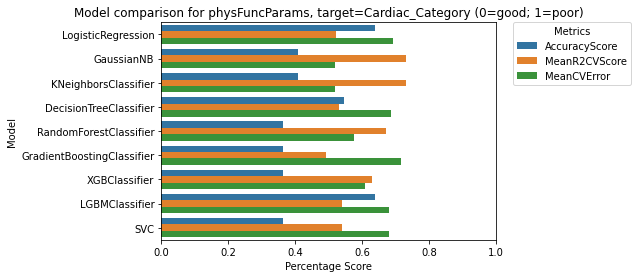

***********************************************
Comparing models for Model comparison for curMeta, target=Cardiac_Category (0=good; 1=poor)
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
C24             13.95
C26             13.95
C28             13.95
Leu1            13.95
C102             6.98
C203OHC183DC     3.49
C183             2.33
C51              1.16
C101             1.16
C143OHC123DC     1.16
C163OHC143DC     1.16
C202OHC182DC     1.16
C225             1.16
C223             1.16
C222             1.16
dtype: float64
Original Shape:(86, 88)
Final Shape:(86, 88)
______________________________
Initialising models...
                        Model  AccuracyScore  MeanR2CVScore  MeanCVError
0          LogisticRegression       0.500000           0.67     0.574456
0                  GaussianNB       0.500000           0.2

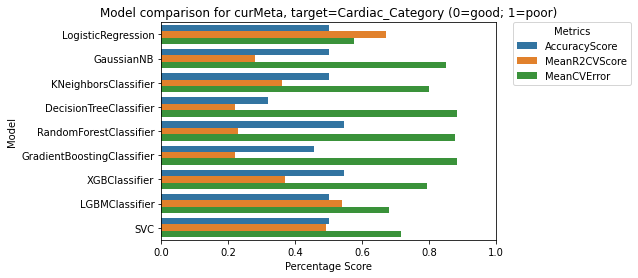

***********************************************
Comparing models for Model comparison for histMeta, target=Cardiac_Category (0=good; 1=poor)
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  1
These columns are:
 ['HistoCode']
Columns with missing values (%):
HistoCode    100.00
HistoC51       2.33
HistoC223      1.16
dtype: float64
Original Shape:(86, 86)
Final Shape:(86, 85)
______________________________
Initialising models...
                        Model  AccuracyScore  MeanR2CVScore  MeanCVError
0          LogisticRegression       0.363636           0.50     0.707107
0                  GaussianNB       0.636364           0.53     0.685565
0        KNeighborsClassifier       0.590909           0.46     0.734847
0      DecisionTreeClassifier       0.772727           0.43     0.754983
0      RandomForestClassifier       0.545455           0.62     0.616441
0  GradientBoostingClass

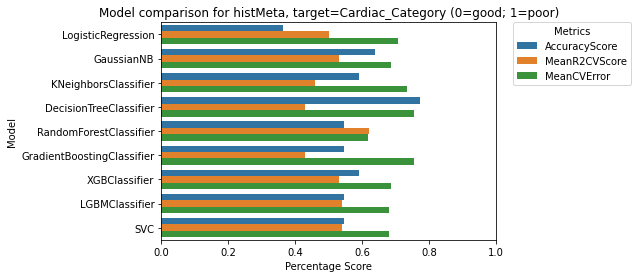

***********************************************


In [59]:
# Cell 9
warnings.filterwarnings(action='ignore', category=UserWarning)

# Use of each group of featrues to classify cardiac category

targetFeat = "Cardiac_Category (0=good; 1=poor)"
for key in cc_dfDict:
    compareClasModel(cc_dfDict[key],targetFeat,title=f"Model comparison for {key}, target={targetFeat}")

Comparing models for Model comparison without E_A_ratio, target=Cardiac_Category (0=good; 1=poor)
Preprocessing dataframe...
Gender column contains only 2 values. Converting to binary
Male
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  4
These columns are:
 ['EDV067', 'LV_Mass_on_mri__g', 'LVEF_A', 'HistoCode']
Columns with missing values (%):
HistoCode                   100.00
EDV067                       65.12
LVEF_A                       65.12
LV_Mass_on_mri__g            43.02
Leu1                         13.95
C28                          13.95
C26                          13.95
C24                          13.95
PASP__mmHg                    8.14
C102                          6.98
Fitness_score                 6.98
Lean_RA                       5.81
WHR                           5.81
BMR                           5.81
Lean_LA                       5.81
Lean_RL                       5.81
Lean_LL       

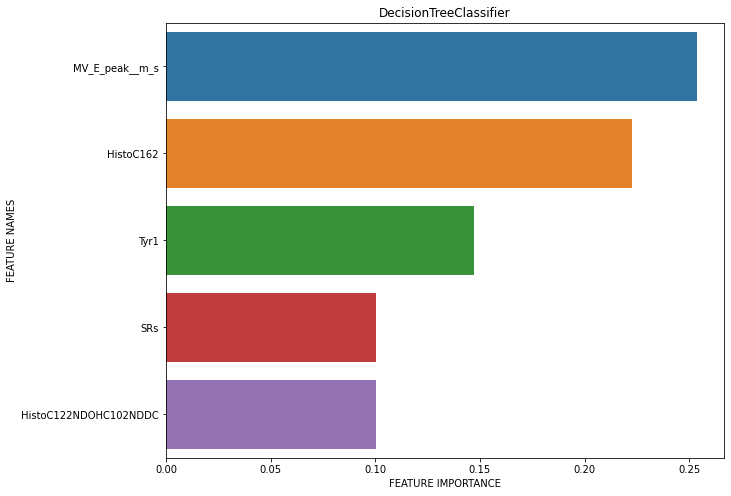

      feature_names  feature_importance
235       HistoC162            0.025754
35   MV_E_peak__m_s            0.017548
18           VO2Max            0.016659
194            Cit1            0.014052
135            C121            0.013712


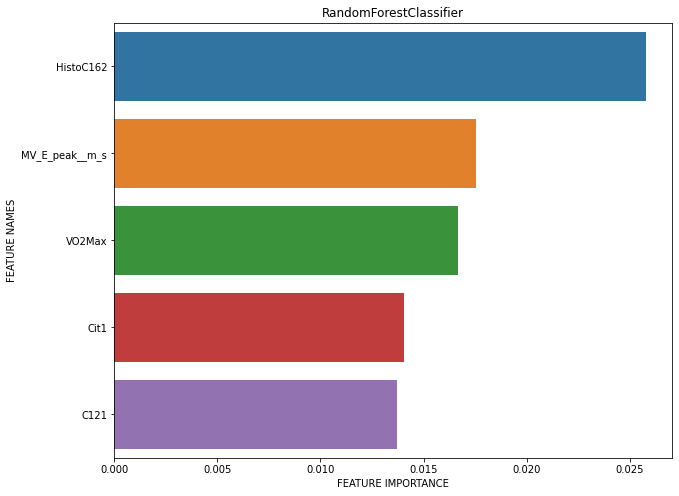

      feature_names  feature_importance
35   MV_E_peak__m_s            0.270178
235       HistoC162            0.162469
36   MV_A_peak__m_s            0.104549
192            Phe1            0.085993
60              SRs            0.058317


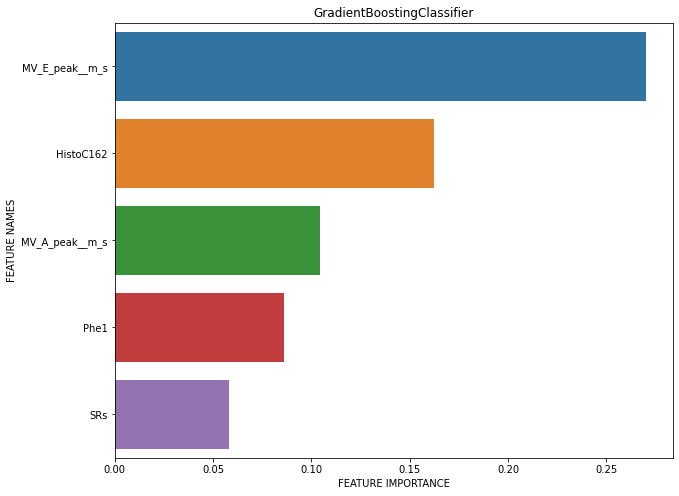

     feature_names  feature_importance
168            C20            0.081136
235      HistoC162            0.078231
68     LAGlobalGLS            0.074640
0              Age            0.057182
70   LAvolumeminml            0.055041


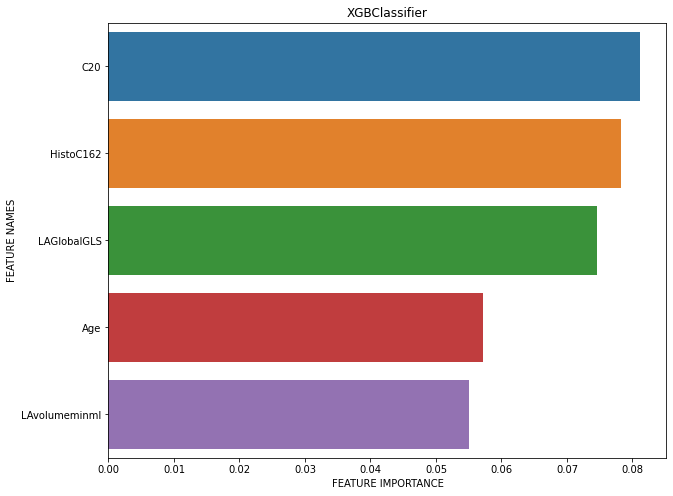

             feature_names  feature_importance
35          MV_E_peak__m_s                  17
194                   Cit1                  13
36          MV_A_peak__m_s                  13
237               HistoC16                   8
230  HistoC143NDOHC123NDDC                   8


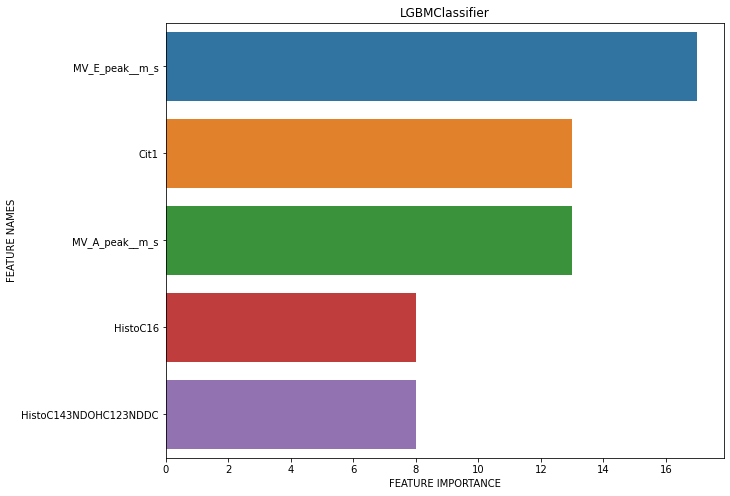

                        Model  AccuracyScore  MeanR2CVScore  MeanCVError
0          LogisticRegression       0.590909           0.35     0.806226
0                  GaussianNB       0.636364           0.37     0.793725
0        KNeighborsClassifier       0.318182           0.28     0.848528
0      DecisionTreeClassifier       0.727273           0.52     0.692820
0      RandomForestClassifier       0.727273           0.62     0.616441
0  GradientBoostingClassifier       0.636364           0.43     0.754983
0               XGBClassifier       0.863636           0.48     0.721110
0              LGBMClassifier       0.818182           0.54     0.678233
0                         SVC       0.590909           0.54     0.678233


Highest Accuracy Score: XGBClassifier. Score: 0.86
Highest CV Score: RandomForestClassifier. Score: 0.62
Lowest CV Error: RandomForestClassifier. Score: 0.62




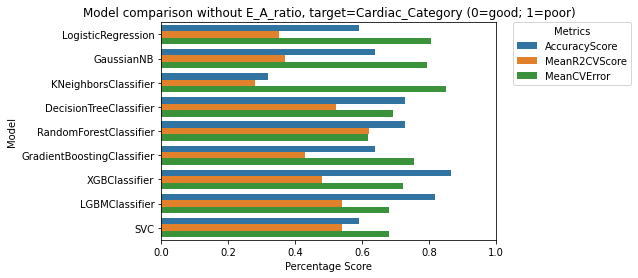

***********************************************


,Model,AccuracyScore,MeanR2CVScore,MeanCVError
0,LogisticRegression,0.590909,0.35,0.806226
0,GaussianNB,0.636364,0.37,0.793725
0,KNeighborsClassifier,0.318182,0.28,0.848528
0,DecisionTreeClassifier,0.727273,0.52,0.692820
0,RandomForestClassifier,0.727273,0.62,0.616441
0,GradientBoostingClassifier,0.636364,0.43,0.754983
0,XGBClassifier,0.863636,0.48,0.721110
0,LGBMClassifier,0.818182,0.54,0.678233
0,SVC,0.590909,0.54,0.678233


In [60]:
# Cell 10
# Use of full data EXCEPT E_A_ratio to classify cardiac cateogry. Performance worsens significantly
targetFeat = "Cardiac_Category (0=good; 1=poor)"
noEAratio = data_full.drop("E_A_ratio",axis = 1)
compareClasModel(noEAratio,targetFeat,title=f"Model comparison without E_A_ratio, target={targetFeat}",showImportance = True)
# Results here shows that only E_A_ratio is necessary to predict cardiac category. Other params have little relevance


Comparing models for Cardiac category with echo
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
PASP__mmHg                  8.14
PVS__cm_s                   2.33
PVD__cm_s                   2.33
PVA__cm_s                   2.33
PVADur                      2.33
sinuscm                     2.33
sinus_tubular_junctioncm    2.33
LVFS                        1.16
Left_atrial_volume          1.16
Left_atrial_volume_index    1.16
MV_DT__ms                   1.16
dtype: float64
Original Shape:(86, 36)
Final Shape:(86, 36)
______________________________
Predicting Cardiac category with echo
                       Model  MeanR2CVScore  MeanR2CVError
0           LinearRegression      -8.291304       1.496730
0              PLSRegression      -0.450084       0.583698
0                      Ridge      -3.305939       1.006642
0           

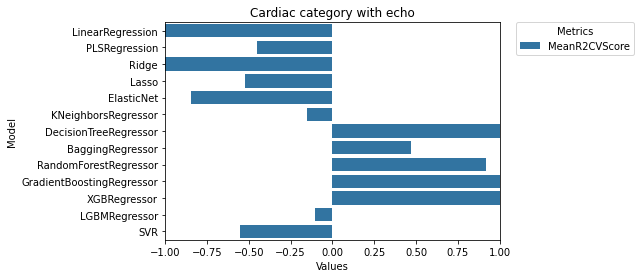

***********************************************


,Model,MeanR2CVScore
0,LinearRegression,-8.291304
0,PLSRegression,-0.450084
0,Ridge,-3.305939
0,Lasso,-0.524034
0,ElasticNet,-0.843139
0,KNeighborsRegressor,-0.152000
0,DecisionTreeRegressor,1.000000
0,BaggingRegressor,0.469333
0,RandomForestRegressor,0.920543
0,GradientBoostingRegressor,1.000000


In [61]:
# Cell 11
# Predicting cardiac cateogory with regression methods using echo params. 
# Demonstrate that regression methods are also useful in prediction
compareRegModel(cc_dfDict["echo"],"Cardiac_Category (0=good; 1=poor)",title="Cardiac category with echo",showImportance=False)

Comparing models for predicting E_A_ratio with full data
Preprocessing dataframe...
Gender column contains only 2 values. Converting to binary
Male
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  4
These columns are:
 ['EDV067', 'LV_Mass_on_mri__g', 'LVEF_A', 'HistoCode']
Columns with missing values (%):
HistoCode                   100.00
EDV067                       65.12
LVEF_A                       65.12
LV_Mass_on_mri__g            43.02
Leu1                         13.95
C28                          13.95
C26                          13.95
C24                          13.95
PASP__mmHg                    8.14
C102                          6.98
Fitness_score                 6.98
Lean_RA                       5.81
WHR                           5.81
BMR                           5.81
Lean_LA                       5.81
Lean_RL                       5.81
Lean_LL                       5.81
BFM                 

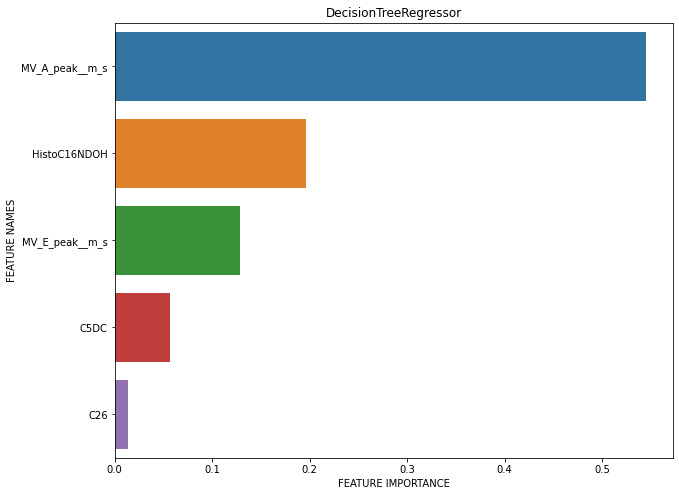

             feature_names  feature_importance
36          MV_A_peak__m_s            0.465546
35          MV_E_peak__m_s            0.104983
18                  VO2Max            0.019739
230  HistoC143NDOHC123NDDC            0.016738
63            SRe_SRaratio            0.014227


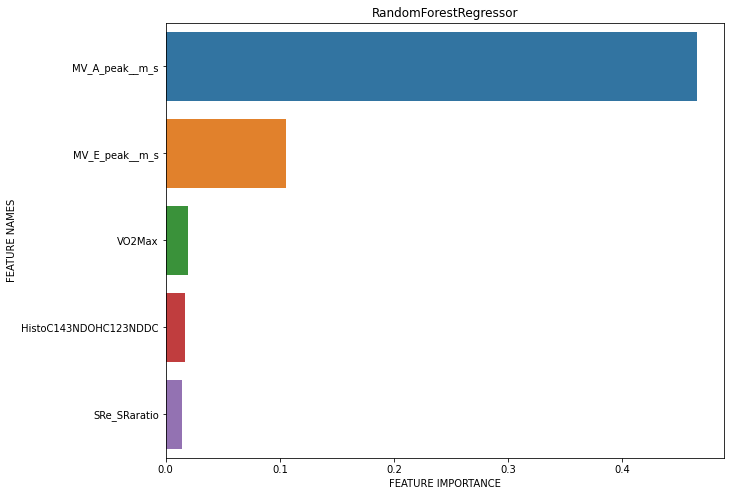

      feature_names  feature_importance
36   MV_A_peak__m_s            0.552009
35   MV_E_peak__m_s            0.216163
241    HistoC16NDOH            0.089478
125      C81OHC61DC            0.019125
63     SRe_SRaratio            0.016786


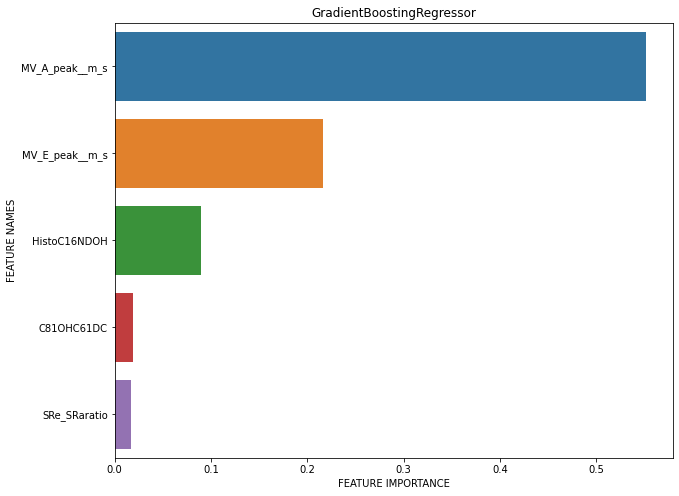

             feature_names  feature_importance
241           HistoC16NDOH            0.410457
230  HistoC143NDOHC123NDDC            0.116876
36          MV_A_peak__m_s            0.109310
77                MCP1pgmL            0.070093
37               MV_DT__ms            0.049180


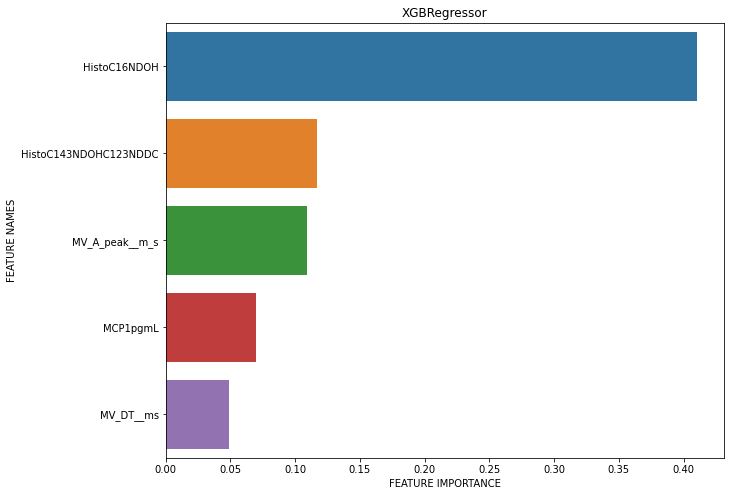

             feature_names  feature_importance
36          MV_A_peak__m_s                  23
35          MV_E_peak__m_s                  20
230  HistoC143NDOHC123NDDC                   7
132                  C81DC                   6
226              HistoC143                   6


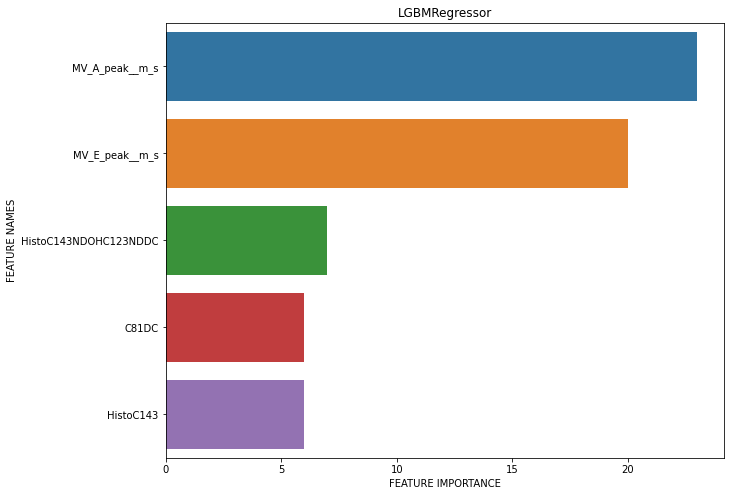

                       Model  MeanR2CVScore  MeanR2CVError
0           LinearRegression     -16.447137       0.476066
0              PLSRegression      -5.725057       0.340032
0                      Ridge     -16.447044       0.476065
0                      Lasso     -26.992927       0.603711
0                 ElasticNet     -31.943195       0.630700
0        KNeighborsRegressor      -1.022298       0.350012
0      DecisionTreeRegressor     -14.612441       0.440236
0           BaggingRegressor      -1.208383       0.316846
0      RandomForestRegressor      -1.773705       0.341803
0  GradientBoostingRegressor      -2.948080       0.297823
0               XGBRegressor      -3.197770       0.409145
0              LGBMRegressor      -0.829219       0.355676
0                        SVR      -0.445836       0.349967


Highest R2CV Score: SVR. Score: -0.45
Lowest CV Error: GradientBoostingRegressor. Score: 0.3




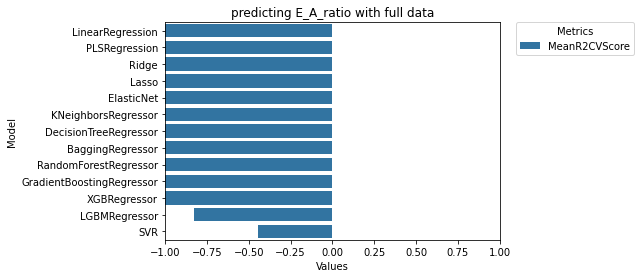

***********************************************


,Model,MeanR2CVScore
0,LinearRegression,-16.447137
0,PLSRegression,-5.725057
0,Ridge,-16.447044
0,Lasso,-26.992927
0,ElasticNet,-31.943195
0,KNeighborsRegressor,-1.022298
0,DecisionTreeRegressor,-14.612441
0,BaggingRegressor,-1.208383
0,RandomForestRegressor,-1.773705
0,GradientBoostingRegressor,-2.948080


In [62]:
# Cell 12
# Use all features tgt except cardiac category to predict E_A_ratio through regression
# Results here show that other parameters are insufficient to predict E_A_ratio 
targetFeat = "E_A_ratio"
regOnEARatio = data_full.drop("Cardiac_Category (0=good; 1=poor)",axis = 1)

compareRegModel(regOnEARatio,targetFeat,title="predicting E_A_ratio with full data",showImportance = True)


Comparing models for LVEF using physFuncParamsCols
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
Fitness_score    6.98
WHR              5.81
Lean_T           5.81
Lean_RL          5.81
Lean_LL          5.81
Lean_RA          5.81
Lean_LA          5.81
BMR              5.81
ALM              5.81
PBF              5.81
BFM              5.81
SMM              5.81
G1L              1.16
G2R              1.16
G1R              1.16
G2L              1.16
Gripmax          1.16
dtype: float64
Original Shape:(86, 17)
Final Shape:(86, 17)
______________________________
Predicting LVEF using physFuncParamsCols
   feature_names  feature_importance
1            G1L            0.240008
14       Lean_RL            0.169822
10           BMR            0.153406
2            G2L            0.104795
4            G2R            0.103295


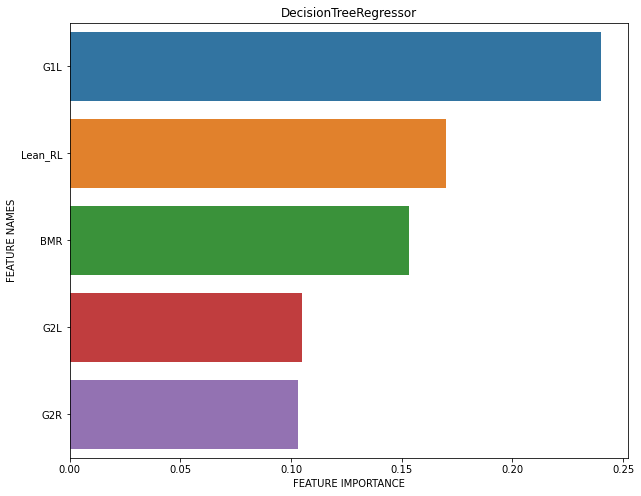

   feature_names  feature_importance
4            G2R            0.113192
9  Fitness_score            0.087380
7            PBF            0.076449
2            G2L            0.069341
6            BFM            0.068221


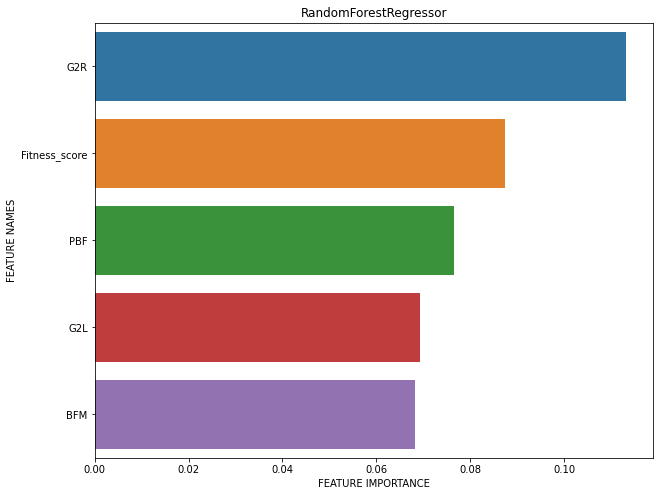

   feature_names  feature_importance
1            G1L            0.162743
13       Lean_LL            0.090594
10           BMR            0.087953
7            PBF            0.080745
5            SMM            0.079848


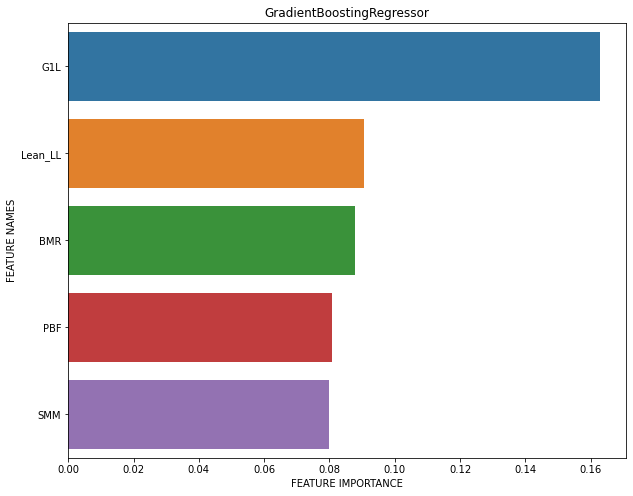

   feature_names  feature_importance
16           ALM            0.176009
15        Lean_T            0.151248
14       Lean_RL            0.132927
7            PBF            0.098546
10           BMR            0.095847


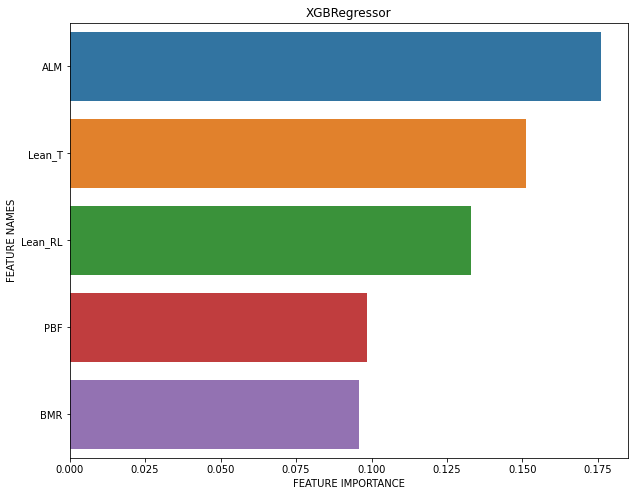

   feature_names  feature_importance
1            G1L                  25
4            G2R                  22
2            G2L                  15
7            PBF                  14
9  Fitness_score                  13


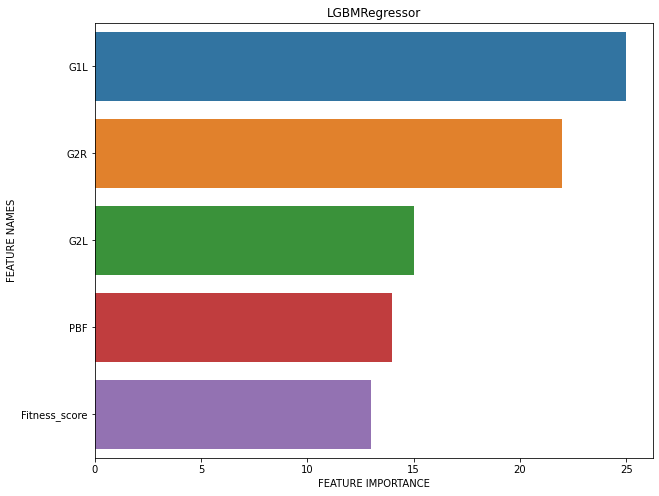

                       Model  MeanR2CVScore  MeanR2CVError
0           LinearRegression    -141.643312      60.268071
0              PLSRegression      -1.165972       9.220132
0                      Ridge      -4.650870      13.442243
0                      Lasso      -4.567326      12.931992
0                 ElasticNet      -4.767279      13.340798
0        KNeighborsRegressor      -0.610478       7.814793
0      DecisionTreeRegressor      -2.483624      11.468083
0           BaggingRegressor      -0.428481       7.691354
0      RandomForestRegressor      -0.633695       7.810748
0  GradientBoostingRegressor      -1.221021       8.890319
0               XGBRegressor      -1.037528       8.603921
0              LGBMRegressor      -0.131926       7.195193
0                        SVR      -0.149191       7.348617


Highest R2CV Score: LGBMRegressor. Score: -0.13
Lowest CV Error: LGBMRegressor. Score: 7.2




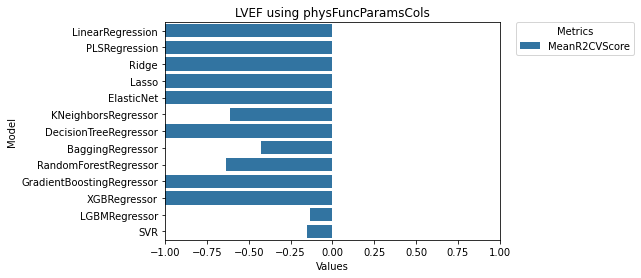

***********************************************
Comparing models for E_A_ratio using physFuncParamsCols
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
Fitness_score    6.98
WHR              5.81
Lean_T           5.81
Lean_RL          5.81
Lean_LL          5.81
Lean_RA          5.81
Lean_LA          5.81
BMR              5.81
ALM              5.81
PBF              5.81
BFM              5.81
SMM              5.81
G1L              1.16
G2R              1.16
G1R              1.16
G2L              1.16
Gripmax          1.16
dtype: float64
Original Shape:(86, 17)
Final Shape:(86, 17)
______________________________
Predicting E_A_ratio using physFuncParamsCols
  feature_names  feature_importance
2           G2L            0.379393
8           WHR            0.335086
6           BFM            0.098398
4           G2R            0.

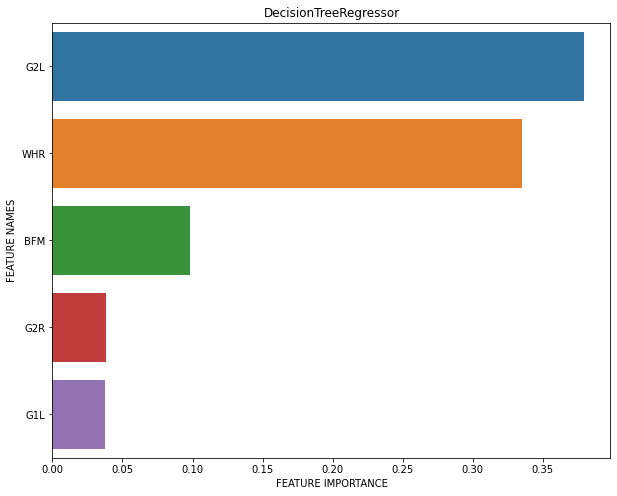

  feature_names  feature_importance
8           WHR            0.196441
7           PBF            0.125523
6           BFM            0.108209
2           G2L            0.100833
1           G1L            0.068552


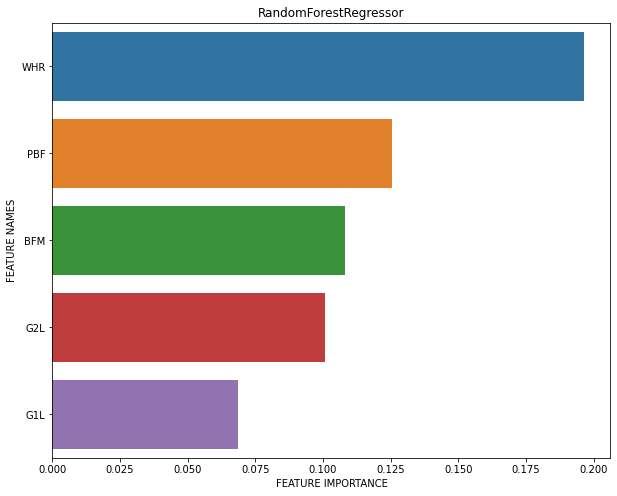

  feature_names  feature_importance
2           G2L            0.238366
8           WHR            0.237572
4           G2R            0.097643
6           BFM            0.080019
1           G1L            0.076182


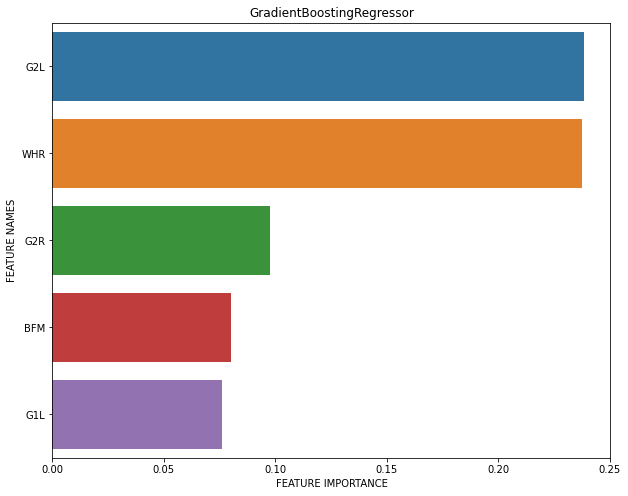

   feature_names  feature_importance
8            WHR            0.428150
2            G2L            0.127935
13       Lean_LL            0.097695
4            G2R            0.070806
12       Lean_RA            0.061096


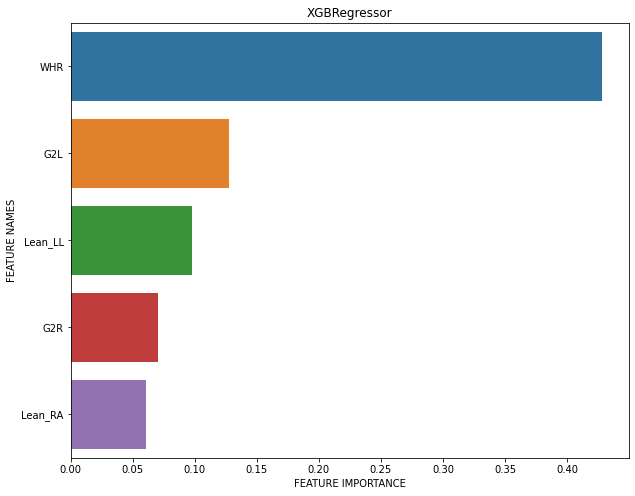

  feature_names  feature_importance
2           G2L                  23
1           G1L                  21
8           WHR                  20
4           G2R                  10
7           PBF                  10


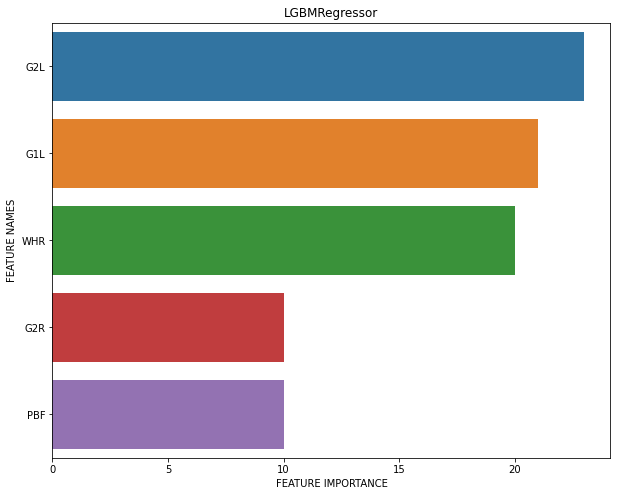

                       Model  MeanR2CVScore  MeanR2CVError
0           LinearRegression -537051.349666     121.366646
0              PLSRegression     -10.186138       0.413199
0                      Ridge     -49.669986       1.131993
0                      Lasso      -7.197342       0.362123
0                 ElasticNet      -7.915685       0.385541
0        KNeighborsRegressor     -11.374406       0.403204
0      DecisionTreeRegressor     -11.879152       0.526562
0           BaggingRegressor      -8.512666       0.407048
0      RandomForestRegressor      -9.442160       0.416582
0  GradientBoostingRegressor     -10.452225       0.452190
0               XGBRegressor     -12.384297       0.509520
0              LGBMRegressor      -0.829219       0.355676
0                        SVR      -3.724190       0.360071


Highest R2CV Score: LGBMRegressor. Score: -0.83
Lowest CV Error: LGBMRegressor. Score: 0.36




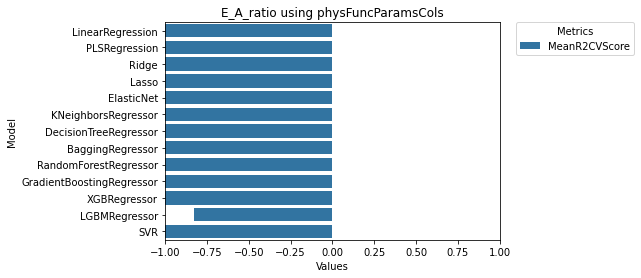

***********************************************


,Model,MeanR2CVScore
0,LinearRegression,-537051.349666
0,PLSRegression,-10.186138
0,Ridge,-49.669986
0,Lasso,-7.197342
0,ElasticNet,-7.915685
0,KNeighborsRegressor,-11.374406
0,DecisionTreeRegressor,-11.879152
0,BaggingRegressor,-8.512666
0,RandomForestRegressor,-9.442160
0,GradientBoostingRegressor,-10.452225


In [63]:
# Cell 13
# Attempting to predict LVEF and E_A_ratio using physical functional parameters through regression

#regData1 = data[physFuncParamsCols + ["LVEF"]]
#regData2 = data[physFuncParamsCols + ["E_A_ratio"]]
compareRegModel(regData1,"LVEF",title="LVEF using physFuncParamsCols", showImportance=True)
compareRegModel(regData2,"E_A_ratio",title="E_A_ratio using physFuncParamsCols", showImportance=True)


Comparing models for Model comparison for truncated data, target=Cardiac_Category (0=good; 1=poor)
Preprocessing dataframe...
Gender column contains only 2 values. Converting to binary
Male
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  1
These columns are:
 ['HistoCode']
Columns with missing values (%):
HistoCode        100.00
Leu1              13.95
C28               13.95
C26               13.95
C24               13.95
Fitness_score      6.98
C102               6.98
ALM                5.81
Lean_T             5.81
BNP                5.81
Lean_LL            5.81
Lean_RA            5.81
Lean_LA            5.81
BMR                5.81
Lean_RL            5.81
WHR                5.81
PBF                5.81
BFM                5.81
SMM                5.81
GALECTIN3          5.81
HSTNI              4.65
C203OHC183DC       3.49
HistoC51           2.33
C183               2.33
MMP9ngmL           2.33
C222          

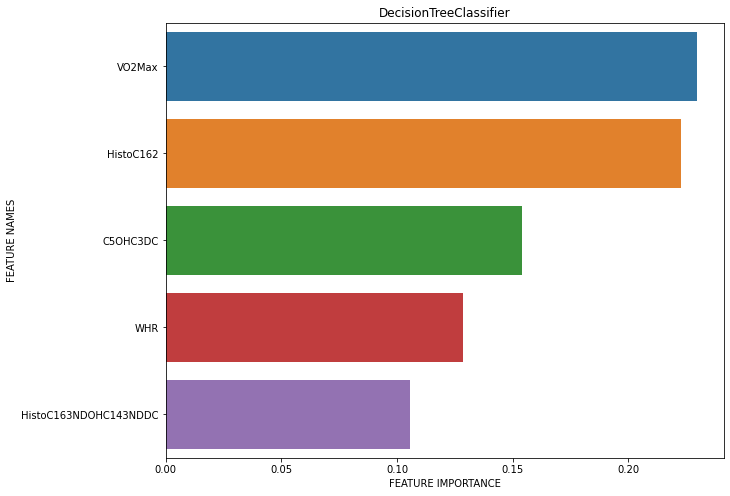

             feature_names  feature_importance
177              HistoC162            0.031072
172  HistoC143NDOHC123NDDC            0.022368
219       HistoHis1_ConcµM            0.015798
118                   C222            0.013859
3                    Pulse            0.012817


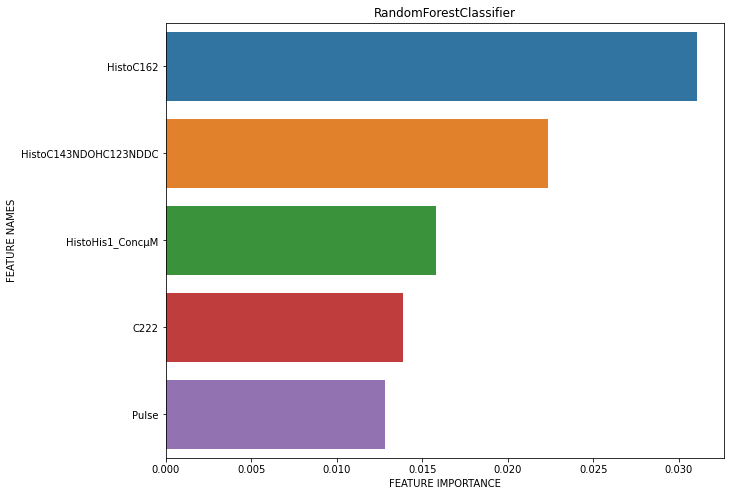

     feature_names  feature_importance
177      HistoC162            0.197066
62        C5OHC3DC            0.120652
18          VO2Max            0.118739
3            Pulse            0.059262
166  HistoC121NDOH            0.053679


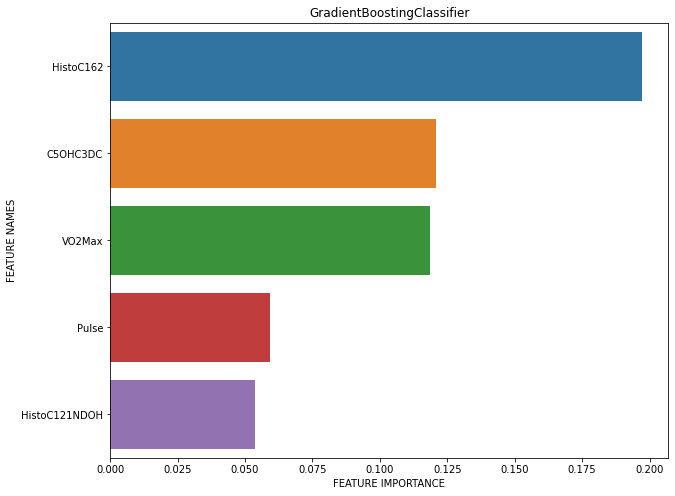

              feature_names  feature_importance
66                     C5DC            0.074029
177               HistoC162            0.068123
60                     C4OH            0.064506
18                   VO2Max            0.059644
8    Hips_Circumference__cm            0.052738


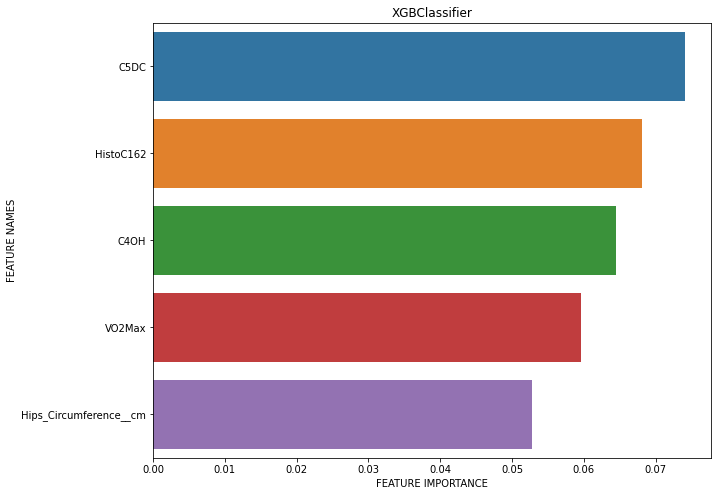

             feature_names  feature_importance
136                   Cit1                  16
172  HistoC143NDOHC123NDDC                  13
179               HistoC16                  12
25                     qTL                  10
44                     WHR                  10


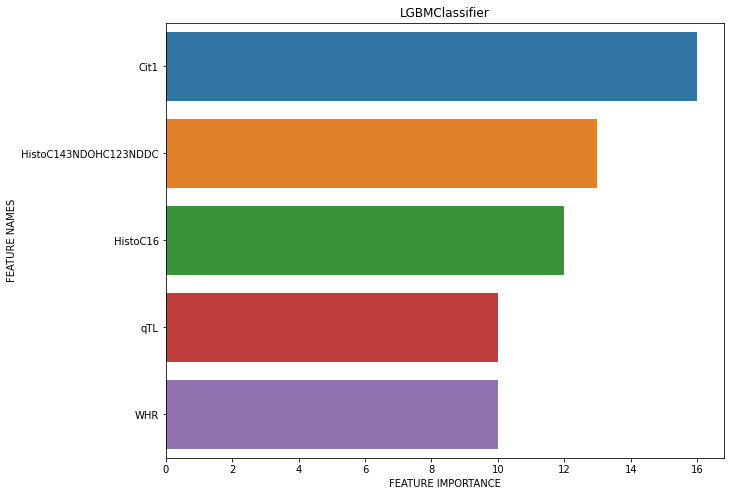

                        Model  AccuracyScore  MeanR2CVScore  MeanCVError
0          LogisticRegression       0.727273           0.40     0.774597
0                  GaussianNB       0.590909           0.41     0.768115
0        KNeighborsClassifier       0.318182           0.28     0.848528
0      DecisionTreeClassifier       0.500000           0.47     0.728011
0      RandomForestClassifier       0.500000           0.57     0.655744
0  GradientBoostingClassifier       0.500000           0.43     0.754983
0               XGBClassifier       0.636364           0.49     0.714143
0              LGBMClassifier       0.500000           0.54     0.678233
0                         SVC       0.590909           0.49     0.714143


Highest Accuracy Score: LogisticRegression. Score: 0.73
Highest CV Score: RandomForestClassifier. Score: 0.57
Lowest CV Error: RandomForestClassifier. Score: 0.66




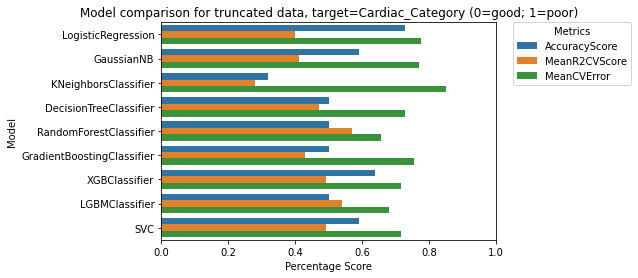

***********************************************


,Model,AccuracyScore,MeanR2CVScore,MeanCVError
0,LogisticRegression,0.727273,0.40,0.774597
0,GaussianNB,0.590909,0.41,0.768115
0,KNeighborsClassifier,0.318182,0.28,0.848528
0,DecisionTreeClassifier,0.500000,0.47,0.728011
0,RandomForestClassifier,0.500000,0.57,0.655744
0,GradientBoostingClassifier,0.500000,0.43,0.754983
0,XGBClassifier,0.636364,0.49,0.714143
0,LGBMClassifier,0.500000,0.54,0.678233
0,SVC,0.590909,0.49,0.714143


In [64]:
# Cell 14
# Since echo and cmr are already known to have clinical significance, we now want to see if there are other features that can be used to predict cardiac category
# Also list down the most important features that we can combine to make a smaller and more curated set of features
# Classification on the whole dataset except for echo and cmr. Poor predictive power

data_trunc = data_full.drop(echoCols+cmrCols, axis=1)
data_trunc # Removal of the 2 most predictive sets of features
targetFeat = "Cardiac_Category (0=good; 1=poor)"
compareClasModel(data_trunc,targetFeat,title=f"Model comparison for truncated data, target={targetFeat}",showImportance = True)

Comparing models for Model comparison for curated data, target=Cardiac_Category (0=good; 1=poor)
Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
WHR     5.81
C222    1.16
qTL     1.16
dtype: float64
Original Shape:(86, 12)
Final Shape:(86, 12)
______________________________
Initialising models...
                        Model  AccuracyScore  MeanR2CVScore  MeanCVError
0          LogisticRegression       0.545455           0.35     0.806226
0                  GaussianNB       0.500000           0.45     0.741620
0        KNeighborsClassifier       0.500000           0.50     0.707107
0      DecisionTreeClassifier       0.500000           0.26     0.860233
0      RandomForestClassifier       0.545455           0.34     0.812404
0  GradientBoostingClassifier       0.409091           0.49     0.714143
0               XGBClassifi

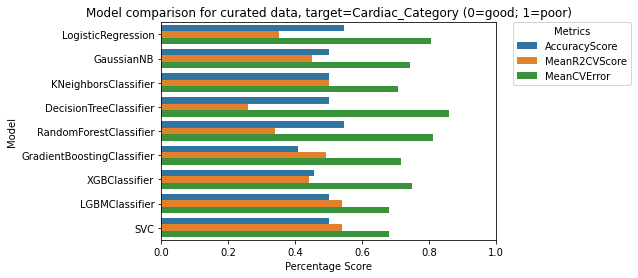

***********************************************


,Model,AccuracyScore,MeanR2CVScore,MeanCVError
0,LogisticRegression,0.545455,0.35,0.806226
0,GaussianNB,0.500000,0.45,0.741620
0,KNeighborsClassifier,0.500000,0.50,0.707107
0,DecisionTreeClassifier,0.500000,0.26,0.860233
0,RandomForestClassifier,0.545455,0.34,0.812404
0,GradientBoostingClassifier,0.409091,0.49,0.714143
0,XGBClassifier,0.454545,0.44,0.748331
0,LGBMClassifier,0.500000,0.54,0.678233
0,SVC,0.500000,0.54,0.678233


In [65]:
# Cell 15
# Manually combine most important features
mostImptCols = ["VO2Max","HistoC162","C5OHC3DC","WHR","HistoC163NDOHC143NDDC","HistoHis1_ConcµM","C222","Pulse","Hips_Circumference__cm","Cit1","qTL","HistoC16","Cardiac_Category (0=good; 1=poor)"]
curatedDf = data_full[mostImptCols]

# Scores got even worse
targetFeat = "Cardiac_Category (0=good; 1=poor)"
compareClasModel(curatedDf,targetFeat,title=f"Model comparison for curated data, target={targetFeat}")

In [66]:
# Cell 16
# Grid Search for tuning LGBM to predict E_A_Ratio using physical functional params
df = regData2
target = "E_A_ratio"
params = {"n_estimators": [50,100, 500],
          "subsample": [0.2,0.4, 0.6, 0.8, 1.0],
          "max_depth": [2, 3, 4, 5],
          "learning_rate": [0.1, 0.01, 0.02, 0.05],
          "min_child_samples": [5, 10, 20, 40]}
y = df[target]
df = df.drop(target, axis = 1)
x = preprocessDf(df)

#print("Predicting " + title)
xTrain,xTest,yTrain,yTest = train_test_split(x,y,test_size=0.25,random_state=0)  
xTrain = xTrain.fillna(xTrain.median())
xTest = xTest.fillna(xTrain.median())
lgbmr = LGBMRegressor().fit(xTrain,yTrain)
cv = GridSearchCV(lgbmr,params,cv=5,verbose=1,n_jobs=-1,scoring="r2").fit(xTrain,yTrain)
print(cv.best_params_)
print(cv.best_score_)

Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
Fitness_score    6.98
WHR              5.81
Lean_T           5.81
Lean_RL          5.81
Lean_LL          5.81
Lean_RA          5.81
Lean_LA          5.81
BMR              5.81
ALM              5.81
PBF              5.81
BFM              5.81
SMM              5.81
G1L              1.16
G2R              1.16
G1R              1.16
G2L              1.16
Gripmax          1.16
dtype: float64
Original Shape:(86, 17)
Final Shape:(86, 17)
______________________________
Fitting 5 folds for each of 960 candidates, totalling 4800 fits
{'learning_rate': 0.01, 'max_depth': 2, 'min_child_samples': 5, 'n_estimators': 100, 'subsample': 0.2}
0.0706065044524327


In [67]:
# Cell 17
# Hyperparameter tuning for random forest using grid search

df = regData2
target = "E_A_ratio"
params = {
    'bootstrap': [True],
    'max_depth': [80,100, 120, 150],
    'max_features': [2, 3, 4, 5],
    'min_samples_leaf': [3, 4, 5, 6,7,8],
    'min_samples_split': [14,16,18,20],
    'n_estimators': [5,10,25]
}
y = df[target]
df = df.drop(target, axis = 1)
x = preprocessDf(df)

#print("Predicting " + title)
xTrain,xTest,yTrain,yTest = train_test_split(x,y,test_size=0.25,random_state=0)
xTrain = xTrain.fillna(xTrain.median())
xTest = xTest.fillna(xTrain.median())
rf = RandomForestRegressor().fit(xTrain,yTrain)
# Instantiate the grid search model
cv = GridSearchCV(rf,params,cv = 5, n_jobs = -1, verbose = 2,scoring="r2").fit(xTrain,yTrain)

print(cv.best_params_)
print(cv.best_score_)

Preprocessing dataframe...
Converting values that are non-numeric AND non-binary to NaN...
Number of columns having more than 40 percent missing values:  0
These columns are:
 []
Columns with missing values (%):
Fitness_score    6.98
WHR              5.81
Lean_T           5.81
Lean_RL          5.81
Lean_LL          5.81
Lean_RA          5.81
Lean_LA          5.81
BMR              5.81
ALM              5.81
PBF              5.81
BFM              5.81
SMM              5.81
G1L              1.16
G2R              1.16
G1R              1.16
G2L              1.16
Gripmax          1.16
dtype: float64
Original Shape:(86, 17)
Final Shape:(86, 17)
______________________________
Fitting 5 folds for each of 1152 candidates, totalling 5760 fits
{'bootstrap': True, 'max_depth': 100, 'max_features': 4, 'min_samples_leaf': 7, 'min_samples_split': 16, 'n_estimators': 5}
0.17434483556929065


In [68]:
"""
# https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# Hyper parameter tuning using randomized search CV on random fores to predict E_A_ratio with physical functional params

from sklearn.model_selection import RandomizedSearchCV

df = regData2
target = "E_A_ratio"

y = df[target]
df = df.drop(target, axis = 1)
x = preprocessDf(df)
xTrain,xTest,yTrain,yTest = train_test_split(x,y,test_size=0.25,random_state=0)
xTrain = xTrain.fillna(xTrain.median())
xTest = xTest.fillna(xTrain.median())

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
#pprint(random_grid)
{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}

 # Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor().fit(xTrain,yTrain)
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(rf, random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(xTrain, yTrain)
print(rf_random.best_params_)
print(rf_random.best_score_)
"""

'\n# https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74\n# Hyper parameter tuning using randomized search CV on random fores to predict E_A_ratio with physical functional params\n\nfrom sklearn.model_selection import RandomizedSearchCV\n\ndf = regData2\ntarget = "E_A_ratio"\n\ny = df[target]\ndf = df.drop(target, axis = 1)\nx = preprocessDf(df)\nxTrain,xTest,yTrain,yTest = train_test_split(x,y,test_size=0.25,random_state=0)\nxTrain = xTrain.fillna(xTrain.median())\nxTest = xTest.fillna(xTrain.median())\n\n# Number of trees in random forest\nn_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]\n# Number of features to consider at every split\nmax_features = [\'auto\', \'sqrt\']\n# Maximum number of levels in tree\nmax_depth = [int(x) for x in np.linspace(10, 110, num = 11)]\nmax_depth.append(None)\n# Minimum number of samples required to split a node\nmin_samples_split = [2, 5, 10]\n# Minimum numbe